# DCGAN (Deep Convolutional Generative Adversarial Networks)

![DCGAN gif](https://media.giphy.com/media/TL0HO5ikb99YMbF0uv/giphy.gif)

## Introduction

&nbsp;&nbsp;&nbsp;I decided to make this notebook as a kind of summary to the methods that I applied in the [Generative Dog Images](https://www.kaggle.com/c/generative-dog-images) competiton as this was my first introduction to the thrilling world of <b>GANs</b>. I hope that this can be of some use to the reader in terms of training, optimizing and creating a robust <b>GAN</b> that can generalize well to new data. I will also try to provide more detailed explanations on the theory behind <b>GANs</b> and why they are so effective.

&nbsp;&nbsp;&nbsp;The main tools for this exercise will be <b>Tensorflow</b>(eager) and <b>Keras</b>(mainly for custom NN layers).

## Generative Adversarial Networks (GANs)

&nbsp;&nbsp;&nbsp;Unlike most popular neural network architectures, <b>GANs</b> are trained to solve two problems simultaneously - <b>discrimination</b> (effectively separating real from fake images) and <b>"realistic"       fake data generation</b> (effectively generating samples considered as real). As we can see these tasks are complete polar opposites but what would happen if we separated them into different models?

&nbsp;&nbsp;&nbsp;Well the general names for these models are <b>Generator (G)</b> and <b>Discriminator (D)</b> and are considered the building blocks behind the theory of <b>GANs</b>.

&nbsp;&nbsp;&nbsp;The <b>Generator</b> network takes as input a simple random noise N-dimensional vector and transforms it according to a learned target distribution. Its output is also N-dimensional. The <b>Discriminator</b> on the other hand models a probability distribution function (like a classifier) and outputs a probability that the input image is real or fake <b>[0, 1]</b>. With this in mind, we can define the two main goals of the generation task:

<b>1. Train G to maximise D's final classification error.</b> (So that the generated images are perceived as real).

<b>2. Train D to minimise the final classification error.</b> (So that real data is correctly distinguished from fake data).

&nbsp;&nbsp;&nbsp;To achieve this, during <b>backpropagation</b>, <b>G</b>'s weights will be updated using <b>Gradient Ascent</b> to maximise the error, while <b>D</b> will use <b>Gradient Descent</b> to minimise it.

![General structure of GANs](https://miro.medium.com/max/1132/1*t82vgL9KcDVpT4JqCb9Q4Q.png)

&nbsp;&nbsp;&nbsp;Note that the two networks don't use the true distribution of images directly during training but instead use each other's outputs to estimate their performance.

&nbsp;&nbsp;&nbsp;So how do we define a <b>loss function</b> that estimates the cumulative performance of the two networks? Well, we can use the <b>Absolute Error</b> to estimate <b>D</b>'s error and then we can reuse the same function for <b>G</b> but maximised:

$$ E(G,D) =  \frac{1}{2}\;(E_{x\subset{p_{t}}\;}[1 - D(x)] + E_{x\subset{p_{g}}\;}[D(x)]) $$
$$ E = \underset{G}{max} (\underset{D}{min}\;E(G,D)) $$

&nbsp;&nbsp;&nbsp;In this case, <b>$p_{t}$</b> represents the true distribution of images, while <b>$p_{g}$</b> is the distribution created from <b>G</b>.

&nbsp;&nbsp;&nbsp;We can observe that this theory is based on some key concepts of <b>Reinforcement Learning</b>. It can thought of as a two-player minimax game, where the two players are competing against each other and thus progressively improving in their respective tasks.

&nbsp;&nbsp;&nbsp;We saw the basic idea behind the theory of <b>GANs</b>. Now let's take one step further and learn how <b>DCGANs</b> work by applying ideas and methods from <b>Convolutional Neural Networks</b>.

## Deep Convolutional Generative Adversarial Networks (DCGANs)

&nbsp;&nbsp;&nbsp;<b>DCGANs</b> utilize some of the basic principles of <b>CNNs</b> and have thus become one of the most widely used architectures in practice, due to their fast convergence and also due to the fact that they can be very easily adapted into more complex variants (using labels as conditions, applying residual blocks and so on). Here are some of the more important problems that <b>DCGANs</b> solve:

- <b>D is created so that it basically solves a supervised image classification task.</b> (for this case dog or no dog)
- <b>The filters learned by the GAN can be utilized to draw specific objects in the generated image.</b>
- <b>G contains vectorized properties that can learn very complex semantic representations of objects.</b>

&nbsp;&nbsp;&nbsp;Here are some of the core guidelines to consider when creating a stable <b>DCGAN</b>, as opposed to a standard <b>CNN</b>(taken from the official [paper](https://arxiv.org/pdf/1511.06434.pdf)):

- <b>Replace Pooling functions with Strided convolutions.</b> (this allows <b>D</b> to learn its own spatial downsampling and <b>G</b> its respective upsampling without adding any bias to the model)
- <b>Use BatchNorm</b> (it stabilizes learning by normalizing the input to each unit to have zero mean and unit variance, this also helps to create more robust deep models without having the gradients diverging)
- <b>Avoid using Fully-Connected hidden layers (not output).</b> (example for this is global average pooling which seems to hurt convergence speed)
- <b>For G - use ReLU activations and Tanh for the output.</b> (tanh is generally the more preffered activation when you have an image as an output as it has a range of [-1, 1])
- <b>For D - use LeakyReLU activations (and a sigmoid function for the output probabilites).</b> (this is tested empirically and seems to work well for modelling to a higher resolution)

&nbsp;&nbsp;&nbsp;Here is the most standard structure of a <b>DCGAN generator</b>:
![DCGAN generator](https://miro.medium.com/max/875/1*KvMnRfb76DponICrHIbSdg.png)

&nbsp;&nbsp;&nbsp;As we can observe, its initial input is simply a <b>(1, 100)</b> noise vector, which passes through <b>4 Convolutional</b> layers with upsampling and a stride of <b>2</b> to produce a result RGB image of size (64, 64, 3). To achieve this, the input vector is projected onto a 1024-dimensional output to match the input of the first <b>Conv</b> layer, which we will see more later on.

&nbsp;&nbsp;&nbsp;What would a standard discriminator look like? Well, about what you would expect, let's take a look:

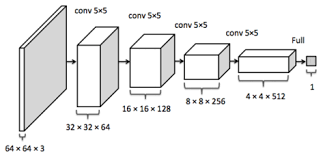

&nbsp;&nbsp;&nbsp;This time around we have an input image of <b>(64, 64, 3)</b>, same as <b>G</b>'s output. We pass it to <b>4 standard downsampling Conv layers</b>, again with a stride of <b>2</b>. In the final output layer, the image gets flattened to a vector, which is usually fed to a sigmoid function, which then outputs <b>D</b>'s prediction for that image <b>(a single value representing the probability in the range [0,1] - dog = 1 or no dog = 0)</b>.

&nbsp;&nbsp;&nbsp;Well, now you saw the basic idea behind <b>GANs</b> and <b>DCGANs</b>, so now we can proceed to generate some dogs :).

&nbsp;&nbsp;&nbsp;Let's first import some libraries and enable <b>Tensorflow's eager execution</b> by removing the computation graphs to speed up the computations.

## Importing libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt, zipfile
import os
import glob
import math
import random
import time
import datetime
import shutil
import imageio
from tqdm import tqdm, tqdm_notebook

from dataclasses import dataclass
from pathlib import Path
import warnings
from scipy import linalg

import xml.etree.ElementTree as ET 

import cv2
from PIL import Image

import tensorflow as tf
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Reshape,\
Conv2DTranspose, Conv2D, Flatten, Dropout, Embedding, ReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.contrib.eager.python import tfe

#from IPython import display

# libraries for SpectralNorm
from tensorflow.keras import backend as K
from keras.engine import *
from keras.legacy import interfaces
from tensorflow.keras import activations
from tensorflow.keras import initializers
from tensorflow.keras import regularizers
from tensorflow.keras import constraints
from keras.utils.generic_utils import func_dump
from keras.utils.generic_utils import func_load
from keras.utils.generic_utils import deserialize_keras_object
from keras.utils.generic_utils import has_arg
from keras.utils import conv_utils

print(os.listdir("../input"))

/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

['generative-dog-images', 'dog-face-generation-competition-kid-metric-input']


Using TensorFlow backend.


In [2]:
tf.enable_eager_execution()

Let's also set some input paths and default variables for later.

## Setting input variables

In [3]:
image_width = 64
image_height = 64
image_channels = 3
image_sample_size = 10000
image_output_dir = '../output_images/'
image_input_dir = '../input/generative-dog-images/all-dogs/all-dogs/'
image_ann_dir = "../input/generative-dog-images/annotation/Annotation/"
OUT_DIR = Path('../output_images/')
MODEL_PATH = '../input/dog-face-generation-competition-kid-metric-input/classify_image_graph_def.pb'
TRAIN_DIR = Path('../input/generative-dog-images/all-dogs/all-dogs')

## Image preprocessing and EDA

&nbsp;&nbsp;&nbsp;Before we proceed with creating the <b>GAN</b> model let's first do a quick exploration of the <b>Stanford Dogs</b> dataset, which we'll be using. Because we also have the annotations for each image, we can use them to map each dog image to its respective breed. To do that, we can first make a dictionary that maps the breed code in the file name to the actual breed name.

### Creating the image features

In [4]:
dog_breed_dict = {}
for annotation in os.listdir(image_ann_dir):
    annotations = annotation.split('-')
    dog_breed_dict[annotations[0]] = annotations[1]

Here I'm going to use <b>OpenCV</b> for a quick function to read and transform the images to <b>RGB</b>.

In [5]:
def read_image(src):
    img = cv2.imread(src)
    if img is None:
        raise FileNotFoundError
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

### Crop the images and apply scaling

&nbsp;&nbsp;&nbsp;If we look at the dataset, we can see that each annotation folder contains a list of <b>xml</b> files. These files are associated with a specific image and contain very useful information, mainly the bounding boxes around each dog in the image. There are also images with more than one dog in them and this allows us to accurately crop them and make a dataset that contains <b>single dogs only</b> images.

&nbsp;&nbsp;&nbsp;Here we can utilize the <b>xml</b> library to create a tree and find the relevant elements for that annotation. For each object we can extract the bounding box coordinates, crop the images and normalize the crop by <b>shrinking</b> or <b>expanding</b> it depending on the result <b>image width</b>. Finally, we'll save the images in a numpy array.

In [6]:
def load_cropped_images(dog_breed_dict=dog_breed_dict, image_ann_dir=image_ann_dir, sample_size=25000, 
                        image_width=image_width, image_height=image_height, image_channels=image_channels):
    curIdx = 0
    breeds = []
    dog_images_np = np.zeros((sample_size,image_width,image_height,image_channels))
    for breed_folder in os.listdir(image_ann_dir):
        for dog_ann in tqdm(os.listdir(image_ann_dir + breed_folder)):
            try:
                img = read_image(os.path.join(image_input_dir, dog_ann + '.jpg'))
            except FileNotFoundError:
                continue
                
            tree = ET.parse(os.path.join(image_ann_dir + breed_folder, dog_ann))
            root = tree.getroot()
            
            size = root.find('size')
            width = int(size.find('width').text)
            height = int(size.find('height').text)
            objects = root.findall('object')
            for o in objects:
                bndbox = o.find('bndbox') 
                
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                
                xmin = max(0, xmin - 4)        # 4 : margin
                xmax = min(width, xmax + 4)
                ymin = max(0, ymin - 4)
                ymax = min(height, ymax + 4)

                w = np.min((xmax - xmin, ymax - ymin))
                w = min(w, width, height)                     # available w

                if w > xmax - xmin:
                    xmin = min(max(0, xmin - int((w - (xmax - xmin))/2)), width - w)
                    xmax = xmin + w
                if w > ymax - ymin:
                    ymin = min(max(0, ymin - int((w - (ymax - ymin))/2)), height - w)
                    ymax = ymin + w
                
                img_cropped = img[ymin:ymin+w, xmin:xmin+w, :]      # [h,w,c]
                # Interpolation method
                if xmax - xmin > image_width:
                    interpolation = cv2.INTER_AREA          # shrink
                else:
                    interpolation = cv2.INTER_CUBIC         # expansion
                    
                img_cropped = cv2.resize(img_cropped, (image_width, image_height), 
                                         interpolation=interpolation)  # resize
                    
                dog_images_np[curIdx,:,:,:] = np.asarray(img_cropped)
                dog_breed_name = dog_breed_dict[dog_ann.split('_')[0]]
                breeds.append(dog_breed_name)
                curIdx += 1
                
    return dog_images_np, breeds

*The features take about 2-3 mins to load. *

&nbsp;&nbsp;&nbsp;By trial, we can figure out that the result images with single dogs only are <b>22125</b> and thus we can specify the exact size of our numpy array. There are <b>120</b> different dog breeds.

In [7]:
start_time = time.time()
dog_images_np, breeds = load_cropped_images(sample_size=22125)
est_time = round(time.time() - start_time)
print("Feature loading time: {}.".format(str(datetime.timedelta(seconds=est_time))))

100%|██████████| 175/175 [00:01<00:00, 117.45it/s]

Feature loading time: 0:02:43.


In [8]:
print('Loaded features shape: ', dog_images_np.shape)
print('Loaded labels: ', len(breeds))

Loaded features shape:  (22125, 64, 64, 3)
Loaded labels:  22125


&nbsp;&nbsp;&nbsp;Now that we have the features and labels, we can plot them in a square grid to see what the crops look like and to make sure that they are labeled correctly.

In [9]:
def plot_features(features, labels, image_width=image_width, image_height=image_height, 
                image_channels=image_channels,
                examples=25, disp_labels=True): 
  
    if not math.sqrt(examples).is_integer():
        print('Please select a valid number of examples.')
        return
    
    imgs = []
    classes = []
    for i in range(examples):
        rnd_idx = np.random.randint(0, len(labels))
        imgs.append(features[rnd_idx, :, :, :])
        classes.append(labels[rnd_idx])
    
    
    fig, axes = plt.subplots(round(math.sqrt(examples)), round(math.sqrt(examples)),figsize=(15,15),
    subplot_kw = {'xticks':[], 'yticks':[]},
    gridspec_kw = dict(hspace=0.3, wspace=0.01))
    
    for i, ax in enumerate(axes.flat):
        if disp_labels == True:
            ax.title.set_text(classes[i])
        ax.imshow(imgs[i])

Note that we need to normalize the pixel values to make sure that the dogs are plotted correctly.

Plotting cropped images by their specified coordinates..


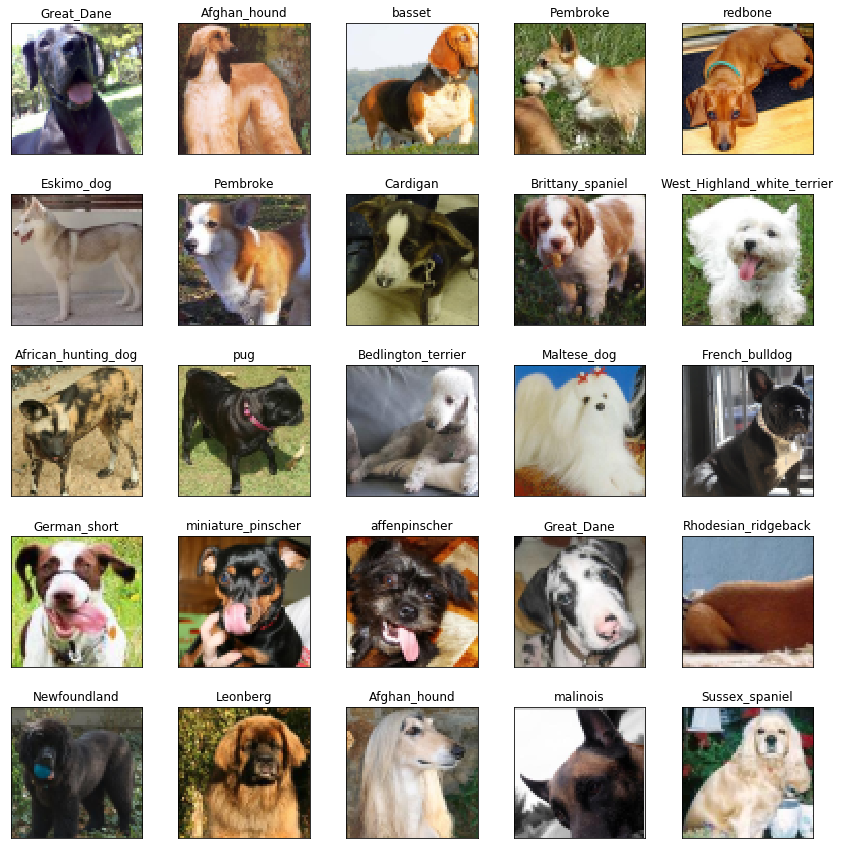

In [10]:
print('Plotting cropped images by their specified coordinates..')
plot_features(dog_images_np / 255., breeds, examples=25, disp_labels=True)

The crops definitely are not perfect, but they do seem to capture only one dog in each image.

### Normalize the pixel values of the images

&nbsp;&nbsp;&nbsp;If you recall from the <b>DCGAN</b> guideline, the <b>Generator</b> is suggested to have a <b>Tanh</b> activation function for its output layer. This means that it produces values in the range <b>[-1, 1]</b> meaning that we also have to apply the same range to our features as a preprocessing step.

In [11]:
dog_images_np = (dog_images_np - 127.5) / 127.5  # normalize the pixel range to [-1, 1] ((image - 127.5) / 127.5) or [0, 1] (image / 255.) alternatively

This is what the images would look like in the input layer of <b>D</b>.

Plotting cropped images by their specified coordinates..


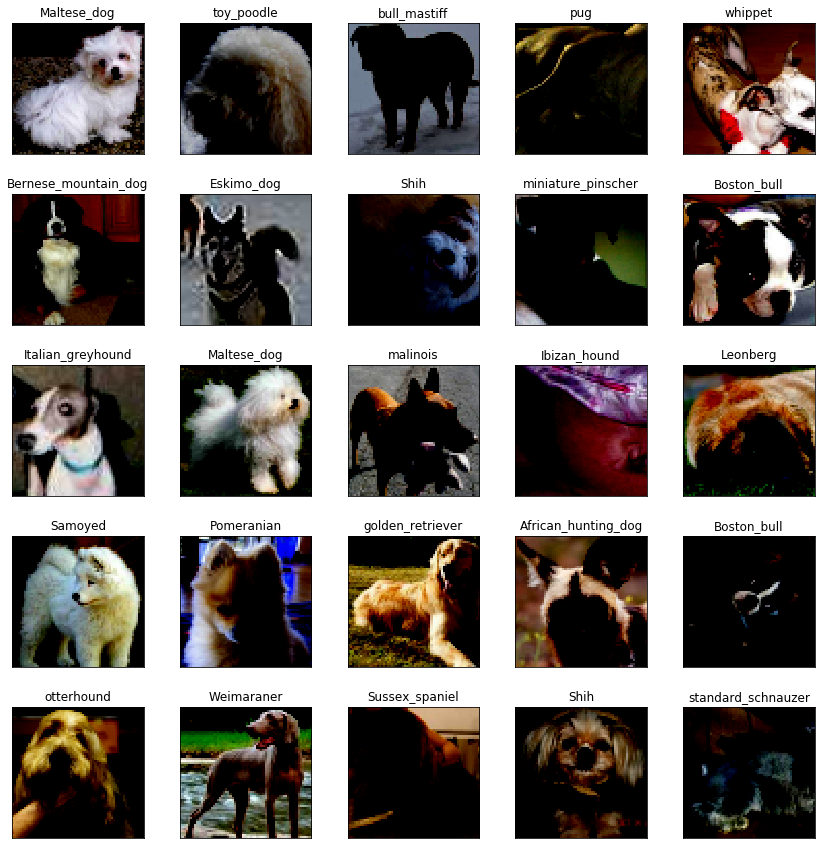

In [12]:
print('Plotting cropped images by their specified coordinates..')
plot_features(dog_images_np, breeds, examples=25, disp_labels=True)

If we select a random image and print out the <b>max and min</b> we can see that the values are correct.

In [13]:
print(np.max(dog_images_np[3,:,:,:]), np.min(dog_images_np[3,:,:,:]))

1.0 -0.984313725490196


### Deprocessing back to the original values

What if we want to return them back to normal? Easy, we just apply the reverse operations and plot them again.

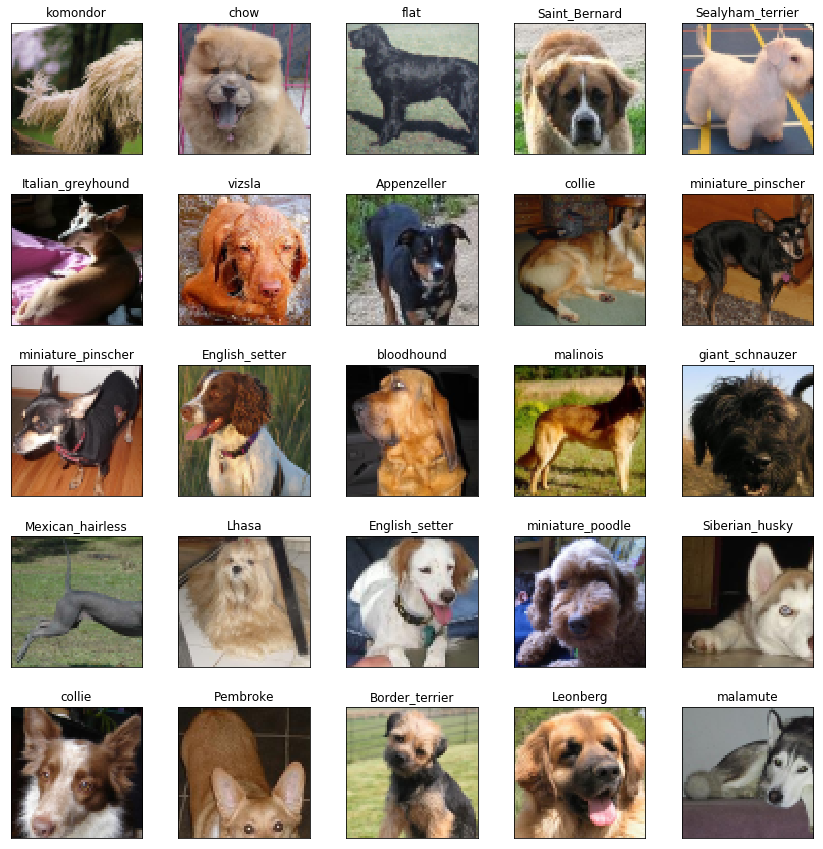

In [14]:
plot_features((dog_images_np * 127.5 + 127.5) / 255., breeds, examples=25, disp_labels=True)

## Creating the image dataset

&nbsp;&nbsp;&nbsp;Now let's use our numpy array of features to construct a <b>Tensorflow</b> dataset object. First, we can convert the data types to <b>float32</b>, which always helps to preserve some memory.

In [15]:
print("Dog features shape:", dog_images_np.shape)

Dog features shape: (22125, 64, 64, 3)


In [16]:
dog_features_tf = tf.cast(dog_images_np, 'float32')

### Data Augmentation

&nbsp;&nbsp;&nbsp;We could also apply <b>Data Augmentation</b> to our dataset. This includes random <b>horizontal flips</b>, zooming and cropping the image in random regions. Out of these, I found only the first method to be somewhat useful for adding some more variance to the dataset, as the other methods introduce a lot of noise.

&nbsp;&nbsp;&nbsp;So in this case, there will be a <b>50%</b> chance that an image in our dataset will be flipped from left to right.

In [17]:
def flip(x: tf.Tensor) -> (tf.Tensor):
    x = tf.image.random_flip_left_right(x)
    return x

def zoom(x: tf.Tensor) -> (tf.Tensor):
    # Generate 20 crop settings, ranging from a 1% to 20% crop.
    scales = list(np.arange(0.7, 1.0, 0.01))
    boxes = np.zeros((len(scales), 4))

    for i, scale in enumerate(scales):
        x1 = y1 = 0.5 - (0.5 * scale)
        x2 = y2 = 0.5 + (0.5 * scale)
        boxes[i] = [x1, y1, x2, y2]

    def random_crop(img):
        # Create different crops for an image
        crops = tf.image.crop_and_resize([img], boxes=boxes, box_ind=np.zeros(len(scales)), crop_size=(64, 64))
        # Return a random crop
        return crops[tf.random_uniform(shape=[], minval=0, maxval=len(scales), dtype=tf.int32)]


    choice = tf.random_uniform(shape=[], minval=0., maxval=1., dtype=tf.float32)

    # Only apply cropping 50% of the time
    return (tf.cond(choice < 0.5, lambda: x, lambda: random_crop(x)))

### Set model hyperparameters

&nbsp;&nbsp;&nbsp;Here we have a whole list of hyperparameters that you can tune and play around with to try and improve the model. I've mostly gathered these values from research papers and experimented a bit with tweaking them and this is what I ended up with. Here's a list of things you could try out:

- <b>Sample size</b> - the number of features
- <b>Batch size</b> - 64 or 32 could improve performance, but are computationally heavy and you can only run the model for a small amount of epochs
- <b>Weight Init Std and Mean</b> - these values are come from research papers and seem to stabilize model training
- <b>Leaky ReLU slope</b> - the threshold for <b>D</b>'s activations, also seems robust
- <b>Downsize factor and Scale factor</b> - set up so that <b>G</b>'s noise vector can be reshaped to (4, 4, 512), other combinations might also work
- <b>Dropout</b> - amount of dropout layers, their placement and their rate could improve performance.
- <b>Learning rate and Learning rate decay</b> - very important to model convergence, hard to tune precisely, <b>G</b> and <b>D</b> can have different learning rates.
- <b>Noise vector shape</b> - usually 128 or 100 seems to be sufficient

In [18]:
sample_size = 22125
batch_size = 128
weight_init_std = 0.02
weight_init_mean = 0.0
leaky_relu_slope = 0.2
downsize_factor = 2
dropout_rate = 0.5
scale_factor = 4 ** downsize_factor
lr_initial_d = tfe.Variable(0.0002)
lr_initial_g = tfe.Variable(0.0002)
lr_decay_steps = 1000
noise_dim = 128

### Create tensorflow-type dataset

&nbsp;&nbsp;&nbsp;Now we can use <b>Tensorflow</b> to create the dataset by shuffling it, applying some augmentation, and finally separating it into batches of the specified <b>Batch size</b>.

In [19]:
dog_features_data = tf.data.Dataset.from_tensor_slices(dog_features_tf).shuffle(sample_size).map(flip).batch(batch_size, drop_remainder=True)

In [20]:
print(dog_features_data)

<DatasetV1Adapter shapes: (128, 64, 64, 3), types: tf.float32>


## Normalization techniques

### Weight Initialization

&nbsp;&nbsp;&nbsp;Before we actually make the <b>Generator</b>, let's see a few normalizations that can gradually speed up a <b>DCGAN</b>'s convergence. 

&nbsp;&nbsp;&nbsp;One of these methods is <b>Weight initialization</b>. It turns out that it's pretty important for training stable <b>GANs</b>. Firstly, the model weights need to be <b>zero-centered</b> with a slight increase of <b>std</b>(0.02). This stabilizes both <b>D</b> and <b>G</b> during training and prevents the model gradients from vanishing or exploding. This is a key step in every case, where we have to use random variables in our model (the random noise vector). 

&nbsp;&nbsp;&nbsp;Here is an example of how <b>Weight initialization</b> can seriously affect the learning process of a Neural Network.

![Weight Initialization example](https://intoli.com/blog/neural-network-initialization/img/training-losses.png)

&nbsp;&nbsp;&nbsp;We can also apply a <b>Truncated Normal</b> distribution using <b>Keras</b>, which will discard <b>values more than 2 standard deviations from the mean</b>. This could perhaps eliminate some outlier points during training.

In [21]:
weight_initializer = tf.keras.initializers.TruncatedNormal(stddev=weight_init_std, mean=weight_init_mean,
                                                          seed=42)

### Spectral Normalization

&nbsp;&nbsp;&nbsp;<b>Spectral Normalization</b> is a new type of weight initialization, designed specifically for <b>GANs</b>, which seems to further stabilize model training (you can read more from this [paper](https://arxiv.org/pdf/1802.05957.pdf)). For a more detailed explanation on <b>Spectral Normalization</b> and why it works it also worth to check out this [post](https://christiancosgrove.com/blog/2018/01/04/spectral-normalization-explained.html), it has very intuitive examples.

&nbsp;&nbsp;&nbsp;<b>Spectral Normalization</b> of a single weight in our network can be defined as the following:

$$ \sigma(W) = ||Wv|| = u^{T}Wv $$
$$ W_{SN}(W) = \frac{W}{\sigma(W)} $$

&nbsp;&nbsp;&nbsp;Here $u$ and $v$ are simple random vectors of the same size. They are utilized to perform what's called a <b>power iteration</b> operation on the specific weight, for each learning step and it proves to be a lot more computationally efficient than simply penalizing the gradients.

&nbsp;&nbsp;&nbsp;Afterwards, in the backpropagation step, we use $W_{SN}(W)$ to update the weights instead of $W$.

&nbsp;&nbsp;&nbsp;For this project, I will reuse some custom <b>Keras</b> layers implemented by <b>IShengFang</b> ([official code](https://github.com/IShengFang/SpectralNormalizationKeras)), to apply <b>Spectral Normalization</b> on top of <b>Conv</b> and <b>Dense</b> layers.

&nbsp;&nbsp;&nbsp;Here is also a good example on the effect of <b>Spectral Normalization</b>:

<center><b>With SN</b></center>
![SNGAN](https://raw.githubusercontent.com/IShengFang/SpectralNormalizationKeras/master/img/generated_img_CIFAR10_resnet_SN_GP/loss.png)

<center><b>Without SN</b></center>
![StandardGAN](https://raw.githubusercontent.com/IShengFang/SpectralNormalizationKeras/master/img/generated_img_CIFAR10_resnet_noSN_GP/loss.png)

In [22]:
class DenseSN(Dense):
    def build(self, input_shape):
        assert len(input_shape) >= 2
        input_dim = input_shape[-1]
        self.kernel = self.add_weight(shape=(input_dim, self.units),
                                      initializer=self.kernel_initializer,
                                      name='kernel',
                                      regularizer=self.kernel_regularizer,
                                      constraint=self.kernel_constraint)
        if self.use_bias:
            self.bias = self.add_weight(shape=(self.units,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
        self.u = self.add_weight(shape=tuple([1, self.kernel.shape.as_list()[-1]]),
                                 initializer=initializers.RandomNormal(0, 1),
                                 name='sn',
                                 trainable=False)
        self.input_spec = InputSpec(min_ndim=2, axes={-1: input_dim})
        self.built = True
        
    def call(self, inputs, training=None):
        def _l2normalize(v, eps=1e-12):
            return v / (K.sum(v ** 2) ** 0.5 + eps)
        def power_iteration(W, u):
            _u = u
            _v = _l2normalize(K.dot(_u, K.transpose(W)))
            _u = _l2normalize(K.dot(_v, W))
            return _u, _v
        W_shape = self.kernel.shape.as_list()
        #Flatten the Tensor
        W_reshaped = K.reshape(self.kernel, [-1, W_shape[-1]])
        _u, _v = power_iteration(W_reshaped, self.u)
        #Calculate Sigma
        sigma=K.dot(_v, W_reshaped)
        sigma=K.dot(sigma, K.transpose(_u))
        #normalize it
        W_bar = W_reshaped / sigma
        #reshape weight tensor
        if training in {0, False}:
            W_bar = K.reshape(W_bar, W_shape)
        else:
            with tf.control_dependencies([self.u.assign(_u)]):
                 W_bar = K.reshape(W_bar, W_shape)  
        output = K.dot(inputs, W_bar)
        if self.use_bias:
            output = K.bias_add(output, self.bias, data_format='channels_last')
        if self.activation is not None:
            output = self.activation(output)
        return output 
    
class ConvSN2D(Conv2D):

    def build(self, input_shape):
        if self.data_format == 'channels_first':
            channel_axis = 1
        else:
            channel_axis = -1
        if input_shape[channel_axis] is None:
            raise ValueError('The channel dimension of the inputs '
                             'should be defined. Found `None`.')
        input_dim = input_shape[channel_axis]
        kernel_shape = self.kernel_size + (input_dim, self.filters)

        self.kernel = self.add_weight(shape=kernel_shape,
                                      initializer=self.kernel_initializer,
                                      name='kernel',
                                      regularizer=self.kernel_regularizer,
                                      constraint=self.kernel_constraint)

        if self.use_bias:
            self.bias = self.add_weight(shape=(self.filters,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
            
        self.u = self.add_weight(shape=tuple([1, self.kernel.shape.as_list()[-1]]),
                         initializer=initializers.RandomNormal(0, 1),
                         name='sn',
                         trainable=False)
        
        # Set input spec.
        self.input_spec = InputSpec(ndim=self.rank + 2,
                                    axes={channel_axis: input_dim})
        self.built = True
    def call(self, inputs, training=None):
        def _l2normalize(v, eps=1e-12):
            return v / (K.sum(v ** 2) ** 0.5 + eps)
        def power_iteration(W, u):
            #Accroding the paper, we only need to do power iteration one time.
            _u = u
            _v = _l2normalize(K.dot(_u, K.transpose(W)))
            _u = _l2normalize(K.dot(_v, W))
            return _u, _v
        #Spectral Normalization
        W_shape = self.kernel.shape.as_list()
        #Flatten the Tensor
        W_reshaped = K.reshape(self.kernel, [-1, W_shape[-1]])
        _u, _v = power_iteration(W_reshaped, self.u)
        #Calculate Sigma
        sigma=K.dot(_v, W_reshaped)
        sigma=K.dot(sigma, K.transpose(_u))
        #normalize it
        W_bar = W_reshaped / sigma
        #reshape weight tensor
        if training in {0, False}:
            W_bar = K.reshape(W_bar, W_shape)
        else:
            with tf.control_dependencies([self.u.assign(_u)]):
                W_bar = K.reshape(W_bar, W_shape)
                
        outputs = K.conv2d(
                inputs,
                W_bar,
                strides=self.strides,
                padding=self.padding,
                data_format=self.data_format,
                dilation_rate=self.dilation_rate)
        if self.use_bias:
            outputs = K.bias_add(
                outputs,
                self.bias,
                data_format=self.data_format)
        if self.activation is not None:
            return self.activation(outputs)
        return outputs

class ConvSN2DTranspose(Conv2DTranspose):

    def build(self, input_shape):
        if len(input_shape) != 4:
            raise ValueError('Inputs should have rank ' +
                             str(4) +
                             '; Received input shape:', str(input_shape))
        if self.data_format == 'channels_first':
            channel_axis = 1
        else:
            channel_axis = -1
        if input_shape[channel_axis] is None:
            raise ValueError('The channel dimension of the inputs '
                             'should be defined. Found `None`.')
        input_dim = input_shape[channel_axis]
        kernel_shape = self.kernel_size + (self.filters, input_dim)

        self.kernel = self.add_weight(shape=kernel_shape,
                                      initializer=self.kernel_initializer,
                                      name='kernel',
                                      regularizer=self.kernel_regularizer,
                                      constraint=self.kernel_constraint)
        if self.use_bias:
            self.bias = self.add_weight(shape=(self.filters,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
            
        self.u = self.add_weight(shape=tuple([1, self.kernel.shape.as_list()[-1]]),
                         initializer=initializers.RandomNormal(0, 1),
                         name='sn',
                         trainable=False)
        
        # Set input spec.
        self.input_spec = InputSpec(ndim=4, axes={channel_axis: input_dim})
        self.built = True  
    
    def call(self, inputs):
        input_shape = K.shape(inputs)
        batch_size = input_shape[0]
        if self.data_format == 'channels_first':
            h_axis, w_axis = 2, 3
        else:
            h_axis, w_axis = 1, 2

        height, width = input_shape[h_axis], input_shape[w_axis]
        kernel_h, kernel_w = self.kernel_size
        stride_h, stride_w = self.strides
        if self.output_padding is None:
            out_pad_h = out_pad_w = None
        else:
            out_pad_h, out_pad_w = self.output_padding

        # Infer the dynamic output shape:
        out_height = conv_utils.deconv_length(height,
                                              stride_h, kernel_h,
                                              self.padding,
                                              out_pad_h)
        out_width = conv_utils.deconv_length(width,
                                             stride_w, kernel_w,
                                             self.padding,
                                             out_pad_w)
        if self.data_format == 'channels_first':
            output_shape = (batch_size, self.filters, out_height, out_width)
        else:
            output_shape = (batch_size, out_height, out_width, self.filters)
            
        #Spectral Normalization    
        def _l2normalize(v, eps=1e-12):
            return v / (K.sum(v ** 2) ** 0.5 + eps)
        def power_iteration(W, u):
            #Accroding the paper, we only need to do power iteration one time.
            _u = u
            _v = _l2normalize(K.dot(_u, K.transpose(W)))
            _u = _l2normalize(K.dot(_v, W))
            return _u, _v
        W_shape = self.kernel.shape.as_list()
        #Flatten the Tensor
        W_reshaped = K.reshape(self.kernel, [-1, W_shape[-1]])
        _u, _v = power_iteration(W_reshaped, self.u)
        #Calculate Sigma
        sigma=K.dot(_v, W_reshaped)
        sigma=K.dot(sigma, K.transpose(_u))
        #normalize it
        W_bar = W_reshaped / sigma
        #reshape weight tensor
        if training in {0, False}:
            W_bar = K.reshape(W_bar, W_shape)
        else:
            with tf.control_dependencies([self.u.assign(_u)]):
                W_bar = K.reshape(W_bar, W_shape)
        self.kernel = W_bar
        
        outputs = K.conv2d_transpose(
            inputs,
            self.kernel,
            output_shape,
            self.strides,
            padding=self.padding,
            data_format=self.data_format)

        if self.use_bias:
            outputs = K.bias_add(
                outputs,
                self.bias,
                data_format=self.data_format)

        if self.activation is not None:
            return self.activation(outputs)
        return outputs

&nbsp;&nbsp;&nbsp;Let's also define some template layers in <b>Keras</b>, so that we can create <b>G</b> and <b>D</b> more easily later on. The standard pattern for the layers will be:

<center><b>TP_Conv_Block = [(Conv(SN)2DTranspose (upsample)) -> (BatchNorm) -> (ReLU)]</b></center>

<center><b>Conv_Block = [(Conv(SN)2D (downsample)) -> (BatchNorm) -> (LeakyReLU)]</b></center>

In [23]:
def transposed_conv(model, out_channels, ksize, stride_size, ptype='same'):
    model.add(Conv2DTranspose(out_channels, (ksize, ksize),
                              strides=(stride_size, stride_size), padding=ptype, 
                              kernel_initializer=weight_initializer, use_bias=False))
    model.add(BatchNormalization())
    model.add(ReLU())
    return model

def transposed_convSN(model, out_channels, ksize, stride_size, ptype='same'):
    model.add(ConvSN2DTranspose(out_channels, (ksize, ksize), 
                              strides=(stride_size, stride_size), padding=ptype, 
                              kernel_initializer=weight_initializer, use_bias=False))
    model.add(BatchNormalization())
    model.add(ReLU())
    return model

def convSN(model, out_channels, ksize, stride_size):
    model.add(ConvSN2D(out_channels, (ksize, ksize), strides=(stride_size, stride_size), padding='same',
                     kernel_initializer=weight_initializer, use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=leaky_relu_slope))
    #model.add(Dropout(dropout_rate))
    return model

def conv(model, out_channels, ksize, stride_size):
    model.add(Conv2D(out_channels, (ksize, ksize), strides=(stride_size, stride_size), padding='same',
                     kernel_initializer=weight_initializer, use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=leaky_relu_slope))
    #model.add(Dropout(dropout_rate))
    return model

## The Generator

&nbsp;&nbsp;&nbsp;We can finally define our generator. The model structure is mostly based on the official DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) with a few tweaks that I found beneficial to the performance. Here is the overall structure:

<center><b>[Input(128, 1) -> Dense(2048,) -> Reshape(4, 4, 128) -> TP_Conv_Block(Depth=512, K=5x5, S=1x1) -> Dropout(0.5) -> TP_Conv_Block(Depth=256, K=5x5, S=2x2) -> Dropout(0.5) -> TP_Conv_Block(Depth=128, K=5x5, S=2x2) -> TP_Conv_Block(Depth=64, K=5x5, S=2x2) -> TP_Conv_Block(Depth=32, K=5x5, S=2x2) -> Dense(Depth=3, Tanh)]</b></center>

In [24]:
def DogGenerator():
    model = Sequential()
    model.add(Dense(image_width // scale_factor * image_height // scale_factor * 128,
                    input_shape=(noise_dim,), kernel_initializer=weight_initializer))
    #model.add(BatchNormalization(epsilon=BN_EPSILON, momentum=BN_MOMENTUM))
    #model.add(LeakyReLU(alpha=leaky_relu_slope))
    model.add(Reshape((image_height // scale_factor, image_width // scale_factor, 128)))
    
    model = transposed_conv(model, 512, ksize=5, stride_size=1)
    model.add(Dropout(dropout_rate))
    model = transposed_conv(model, 256, ksize=5, stride_size=2)
    model.add(Dropout(dropout_rate))
    model = transposed_conv(model, 128, ksize=5, stride_size=2)
    model = transposed_conv(model, 64, ksize=5, stride_size=2)
    model = transposed_conv(model, 32, ksize=5, stride_size=2)
    
    model.add(Dense(3, activation='tanh', kernel_initializer=weight_initializer))

    return model

In [25]:
dog_generator = DogGenerator()
print(dog_generator.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 2048)              264192    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 128)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 4, 4, 512)         1638400   
_________________________________________________________________
batch_normalization (BatchNo (None, 4, 4, 512)         2048      
_________________________________________________________________
re_lu (ReLU)                 (None, 4, 4, 512)         0         
_________________________________________________________________
dropout (Dropout)            (None, 4, 4, 512)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 8, 8, 256)         3

&nbsp;&nbsp;&nbsp;We can confirm that the <b>Generator</b> works initially by feeding it a random noise vector of the right size. The output image should be normalized to similar black-colored pixels due to the <b>Weight Initialization</b> step described earlier <b>(they should be relatively zero-centered)</b>.

(1, 64, 64, 3)
(1, 128) -0.0025973357 1.0040334


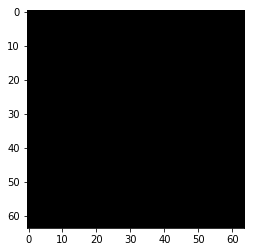

In [26]:
# random noise vector
noise = tf.random.normal([1,noise_dim])
#sample = generate_latent_points(100, 50)
# run the generator model with the noise vector as input
generated_image = dog_generator(noise, training=False)
# display output
plt.imshow(generated_image[0, :, :, :])
print(generated_image.shape)
#print(sample.shape, sample.mean(), sample.std())
print(noise.shape, tf.math.reduce_mean(noise).numpy(), tf.math.reduce_std(noise).numpy())

## The Discriminator

&nbsp;&nbsp;&nbsp;The <b>Discriminator</b> is relatively easier to implement, since its basically a small <b>CNN</b> two-class classifier. We can choose whether to apply <b>Spectral Normalization</b> or not and see the performance effects. For this example, I will try to apply <b>SN</b> only in <b>D</b>. Here is <b>D</b>'s structure:

<center><b>[Input(128, 128, 3) -> Conv(SN)2D(Depth=64, K=5x5, S=1x1, same) -> LeakyReLU -> Conv_Block(Depth=64, K=5x5, S=2x2) -> Conv_Block(Depth=128, K=5x5, S=2x2) -> Conv_Block(Depth=256, K=5x5, S=2x2) -> Flatten -> Dense(16384, Sigmoid)]</b></center>

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
&nbsp;&nbsp;&nbsp;Also note that all <b>Conv</b> and <b>Dense</b> layers are initialized with the <b>Truncated Normal</b> distribution defined above. Another thing is that the <b>bias</b> term is removed from the <b>Conv</b> layers, which also stabilizes the model a little bit.

In [27]:
def DogDiscriminator(spectral_normalization=True):
    model = Sequential()
    if spectral_normalization:
        model.add(ConvSN2D(64, (5, 5), strides=(1,1), padding='same', use_bias=False,
                         input_shape=[image_height, image_width, image_channels], 
                         kernel_initializer=weight_initializer))
        #model.add(BatchNormalization(epsilon=BN_EPSILON, momentum=BN_MOMENTUM))
        model.add(LeakyReLU(alpha=leaky_relu_slope))
        #model.add(Dropout(dropout_rate))
        
        model = convSN(model, 64, ksize=5, stride_size=2)
        #model = convSN(model, 128, ksize=3, stride_size=1)
        model = convSN(model, 128, ksize=5, stride_size=2)
        #model = convSN(model, 256, ksize=3, stride_size=1)
        model = convSN(model, 256, ksize=5, stride_size=2)
        #model = convSN(model, 512, ksize=3, stride_size=1)
        #model.add(Dropout(dropout_rate))

        model.add(Flatten())
        model.add(DenseSN(1, activation='sigmoid'))
    else:
        model.add(Conv2D(64, (4, 4), strides=(2,2), padding='same', use_bias=False,
                         input_shape=[image_height, image_width, image_channels], 
                         kernel_initializer=weight_initializer))
        #model.add(BatchNormalization(epsilon=BN_EPSILON, momentum=BN_MOMENTUM))
        model.add(LeakyReLU(alpha=leaky_relu_slope))
        #model.add(Dropout(dropout_rate))

        model = conv(model, 64, ksize=4, stride_size=2)
        #model = convSN(model, 128, ksize=3, stride_size=1)
        model = conv(model, 128, ksize=4, stride_size=2)
        #model = convSN(model, 256, ksize=3, stride_size=1)
        model = conv(model, 256, ksize=4, stride_size=2)
        #model = convSN(model, 512, ksize=3, stride_size=1)

        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))
    return model

In [28]:
dog_discriminator = DogDiscriminator(spectral_normalization=True)
print(dog_discriminator.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_s_n2d (ConvSN2D)        (None, 64, 64, 64)        4864      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 64, 64, 64)        0         
_________________________________________________________________
conv_s_n2d_1 (ConvSN2D)      (None, 32, 32, 64)        102464    
_________________________________________________________________
batch_normalization_5 (Batch (None, 32, 32, 64)        256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv_s_n2d_2 (ConvSN2D)      (None, 16, 16, 128)       204928    
_________________________________________________________________
batch_normalization_6 (Batch (None, 16, 16, 128)      

Below we can observe, that <b>D</b> indeed outputs a probability very close to <b>0.5</b> for a noisy input.

In [29]:
decision = dog_discriminator(generated_image)
print(decision)

tf.Tensor([[0.5000184]], shape=(1, 1), dtype=float32)


## Further optimization tricks

### Label smoothing

&nbsp;&nbsp;&nbsp;One regularization method that can be applied during training is called <b>Label smoothing</b>. What this does is that it essentially prevents <b>D</b> from being overconfident or underconfident in its predictions. If <b>D</b> becomes too certain that there is a dog in a specific image, <b>G</b> can exploit that fact and continuously start to generate only images of that sort and in turn, cease to improve. We can combat this, by setting the class labels to be in the range <b>[0, 0.3]</b> for the negative classes and <b>[0.7, 1]</b> for the positive ones. 

&nbsp;&nbsp;&nbsp;This will prevent the overall probabilities from getting very close to the two thresholds.

In [30]:
# Label smoothing -- technique from GAN hacks, instead of assigning 1/0 as class labels, we assign a random integer in range [0.7, 1.0] for positive class
# and [0.0, 0.3] for negative class

def smooth_positive_labels(y):
    return y - 0.3 + (np.random.random(y.shape) * 0.5)

def smooth_negative_labels(y):
    return y + np.random.random(y.shape) * 0.3

### Introducing some noise to the labels

&nbsp;&nbsp;&nbsp;This technique is also called <b>Instance Noise</b>. By adding a small amount of error to the labels (let's say 5%), this tends to make the true and predicted distributions more spread out and thus start to overlap with each other. This in turn makes fitting a custom distribution of generated images easier in the learning process.

&nbsp;&nbsp;&nbsp;Here is a good example of how the two distributions look like with these techniques:

![Smoothing and noise effect on distributions](https://www.inference.vc/content/images/2016/10/instance_noise.png)

In [31]:
# randomly flip some labels
def noisy_labels(y, p_flip):
    # determine the number of labels to flip
    n_select = int(p_flip * int(y.shape[0]))
    # choose labels to flip
    flip_ix = np.random.choice([i for i in range(int(y.shape[0]))], size=n_select)
    
    op_list = []
    # invert the labels in place
    #y_np[flip_ix] = 1 - y_np[flip_ix]
    for i in range(int(y.shape[0])):
        if i in flip_ix:
            op_list.append(tf.subtract(1, y[i]))
        else:
            op_list.append(y[i])
    
    outputs = tf.stack(op_list)
    return outputs

### Optimizers

&nbsp;&nbsp;&nbsp;The best proven optimization algorithm for this task is <b>Adam</b> with a standard learning rate of <b>0.0002</b> for both models and a beta of <b>0.5</b>.

In [32]:
generator_optimizer = tf.train.AdamOptimizer(learning_rate=lr_initial_g, beta1=0.5)
discriminator_optimizer = tf.train.AdamOptimizer(learning_rate=lr_initial_d, beta1=0.5)
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

### Defining the loss functions

&nbsp;&nbsp;&nbsp;Another new trend in optimizing <b>GANs</b> recently has been applying a <b>Relativistic</b> loss function as opposed to the standard one. Those functions measure the probability that the real data is more "realistic" than the generated data. One of the more popular relativistic function choices include <b>RaLSGAN (Relativistic Average Least Squares), RaSGAN (Relativistic Average Standard) and RaHinge (Relativistic Hinge loss)</b>.

&nbsp;&nbsp;&nbsp;But before all of that, let's define the standard <b>GAN</b> loss:

$$ \underset{D}{min}(V(D)) = - E_{x}[\log{D(x)}] - E_{z}[\log{(1-D(G(z)))}] $$

&nbsp;&nbsp;&nbsp;As we can observe, this is basically the standard <b>Binary Crossentropy loss</b> used for classification tasks or the <b>Logistic Loss</b> between the real and generated distributions.

&nbsp;&nbsp;&nbsp;In comparison, here is what an <b>RSGAN (Relativistic Standard)</b> loss looks like:

$$ L^{RSGAN}_{D} = - E_{(x_{r},x_{f})}[\log{(sigmoid(C(x_{r}) - C(x_{f})))}] $$
$$ L^{RSGAN}_{G} = - E_{(x_{r},x_{f})}[\log{(sigmoid(C(x_{f}) - C(x_{r})))}] $$

&nbsp;&nbsp;&nbsp;In this case the task is different, to measure the similarity between the <b>real (r)</b> and <b>fake (f)</b> data distributions. RSGAN reaches the optimal point when D(x) = 0.5 (i.e. $C(x_{r}) = C(x_{f})$). There are many relativistic loss function variants and they all contain different methods for measuring this similarity. In this project, I've tried out <b>3</b> of the variants that seemed to have the best documented <b>MIFID</b> score <b>(RaLSGAN, RaSGAN and RaHinge)</b>. Feel free to try out different losses for yourself to see if you can improve the performance ;). Here's a big list of the most commonly used ones:

![GAN losses](https://miro.medium.com/max/875/1*QKG1fVOMjGlVUvICYmz8vQ.png)

&nbsp;&nbsp;&nbsp;With this in mind, I have devised a nice little decision tree function for choosing the losses for both <b>G</b> and <b>D</b>. Note that <b>instance noise</b> and <b>label smoothing</b> need to be applied before calculating the actual losses. 

&nbsp;&nbsp;&nbsp;Throughout many trials for this particular problem, I didn't find any increase in performance by switching to <b>Relativistic</b> losses, so I decided to stick with the standard <b>GAN</b> loss function, as it is much simpler to estimate, though in some cases these losses can really speed up convergence in your model.

In [33]:
def discriminator_loss(real_output, fake_output, loss_func, apply_label_smoothing=True, label_noise=True):
    if label_noise and apply_label_smoothing:
        real_output_noise = noisy_labels(tf.ones_like(real_output), 0.05)
        fake_output_noise = noisy_labels(tf.zeros_like(fake_output), 0.05)
        real_output_smooth = smooth_positive_labels(real_output_noise)
        fake_output_smooth = smooth_negative_labels(fake_output_noise)
        if loss_func == 'gan': 
            real_loss = cross_entropy(tf.ones_like(real_output_smooth), real_output)
            fake_loss = cross_entropy(tf.zeros_like(fake_output_smooth), fake_output)
        else:
            if loss_func == 'ralsgan':
                return (tf.reduce_mean(tf.square(real_output_smooth - tf.reduce_mean(fake_output_smooth) - tf.ones_like(real_output_smooth)))
        + tf.reduce_mean(tf.square(fake_output_smooth - tf.reduce_mean(real_output_smooth) + tf.ones_like(fake_output_smooth)))) / 2.
            elif loss_func == 'rasgan':
                avg_fake_logit = tf.reduce_mean(fake_output_smooth)
                avg_real_logit = tf.reduce_mean(real_output_smooth)
                D_r_tilde = tf.nn.sigmoid(real_output_smooth - avg_fake_logit)
                D_f_tilde = tf.nn.sigmoid(fake_output_smooth - avg_real_logit)
                total_loss = - tf.reduce_mean(tf.log(
                    D_r_tilde + 1e-14)) - tf.reduce_mean(tf.log(1 - D_f_tilde + 1e-14))
                return total_loss
            elif loss_func == 'rahinge':
                real_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(real_output_smooth) - (real_output_smooth - tf.reduce_mean(fake_output_smooth))))
                fake_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(fake_output_smooth) + (fake_output_smooth - tf.reduce_mean(real_output_smooth))))
        total_loss = real_loss + fake_loss
        return total_loss
    elif label_noise and not apply_label_smoothing:
        real_output_noise = noisy_labels(tf.ones_like(real_output), 0.05)
        fake_output_noise = noisy_labels(tf.zeros_like(fake_output), 0.05)
        if loss_func == 'gan': 
            real_loss = cross_entropy(tf.ones_like(real_output_noise), real_output)
            fake_loss = cross_entropy(tf.zeros_like(fake_output_noise), fake_output)
        else:
            if loss_func == 'ralsgan':
                return (tf.reduce_mean(tf.square(real_output_noise - tf.reduce_mean(fake_output_noise) - tf.ones_like(real_output_noise)))
        + tf.reduce_mean(tf.square(fake_output_noise - tf.reduce_mean(real_output_noise) + tf.ones_like(fake_output_noise)))) / 2.
            elif loss_func == 'rasgan':
                avg_fake_logit = tf.reduce_mean(fake_output_noise)
                avg_real_logit = tf.reduce_mean(real_output_noise)
                D_r_tilde = tf.nn.sigmoid(real_output_noise - avg_fake_logit)
                D_f_tilde = tf.nn.sigmoid(fake_output_noise - avg_real_logit)
                total_loss = - tf.reduce_mean(tf.log(
                    D_r_tilde + 1e-14)) - tf.reduce_mean(tf.log(1 - D_f_tilde + 1e-14))
                return total_loss
            elif loss_func == 'rahinge':
                real_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(real_output_noise) - (real_output_noise - tf.reduce_mean(fake_output_noise))))
                fake_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(fake_output_noise) + (fake_output_noise - tf.reduce_mean(real_output_noise))))
        total_loss = real_loss + fake_loss
        return total_loss
    elif apply_label_smoothing and not label_noise:
        real_output_smooth = smooth_positive_labels(tf.ones_like(real_output))
        fake_output_smooth = smooth_negative_labels(tf.zeros_like(fake_output))
        if loss_func == 'gan': 
            real_loss = cross_entropy(tf.ones_like(real_output_smooth), real_output)
            fake_loss = cross_entropy(tf.zeros_like(fake_output_smooth), fake_output)
        else:
            if loss_func == 'ralsgan':
                return (tf.reduce_mean(tf.square(real_output_smooth - tf.reduce_mean(fake_output_smooth) - tf.ones_like(real_output_smooth)))
        + tf.reduce_mean(tf.square(fake_output_smooth - tf.reduce_mean(real_output_smooth) + tf.ones_like(fake_output_smooth)))) / 2.
            elif loss_func == 'rasgan':
                avg_fake_logit = tf.reduce_mean(fake_output_smooth)
                avg_real_logit = tf.reduce_mean(real_output_smooth)
                D_r_tilde = tf.nn.sigmoid(real_output_smooth - avg_fake_logit)
                D_f_tilde = tf.nn.sigmoid(fake_output_smooth - avg_real_logit)
                total_loss = - tf.reduce_mean(tf.log(
                    D_r_tilde + 1e-14)) - tf.reduce_mean(tf.log(1 - D_f_tilde + 1e-14))
                return total_loss
            elif loss_func == 'rahinge':
                real_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(real_output_smooth) - (real_output_smooth - tf.reduce_mean(fake_output_smooth))))
                fake_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(fake_output_smooth) + (fake_output_smooth - tf.reduce_mean(real_output_smooth))))
        total_loss = real_loss + fake_loss
        return total_loss    
    else:
        if loss_func == 'gan': 
            real_loss = cross_entropy(tf.ones_like(real_output), real_output)
            fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        else:
            if loss_func == 'ralsgan':
                return (tf.reduce_mean(tf.square(real_output - tf.reduce_mean(fake_output) - tf.ones_like(real_output)))
        + tf.reduce_mean(tf.square(fake_output - tf.reduce_mean(real_output) + tf.ones_like(fake_output)))) / 2.
            elif loss_func == 'rasgan':
                avg_fake_logit = tf.reduce_mean(fake_output)
                avg_real_logit = tf.reduce_mean(real_output)
                D_r_tilde = tf.nn.sigmoid(real_output - avg_fake_logit)
                D_f_tilde = tf.nn.sigmoid(fake_output - avg_real_logit)
                total_loss = - tf.reduce_mean(tf.log(
                    D_r_tilde + 1e-14)) - tf.reduce_mean(tf.log(1 - D_f_tilde + 1e-14))
                return total_loss
            elif loss_func == 'rahinge':
                real_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(real_output) - (real_output - tf.reduce_mean(fake_output))))
                fake_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(fake_output) + (fake_output - tf.reduce_mean(real_output))))
        total_loss = real_loss + fake_loss
        return total_loss

In [34]:
def generator_loss(real_output, fake_output, loss_func, apply_label_smoothing=True):
    if apply_label_smoothing:
        fake_output_smooth = smooth_negative_labels(tf.ones_like(fake_output))
        if loss_func == 'gan':
            return cross_entropy(tf.ones_like(fake_output_smooth), fake_output)
        else:
            if loss_func == 'ralsgan':
                return (tf.reduce_mean(tf.square(real_output - tf.reduce_mean(fake_output_smooth) + tf.ones_like(real_output)))
        + tf.reduce_mean(tf.square(fake_output_smooth - tf.reduce_mean(real_output) - tf.ones_like(fake_output_smooth)))) / 2.
            elif loss_func == 'rasgan':
                avg_fake_logit = tf.reduce_mean(fake_output_smooth)
                avg_real_logit = tf.reduce_mean(real_output)
                D_r_tilde = tf.nn.sigmoid(real_output - avg_fake_logit)
                D_f_tilde = tf.nn.sigmoid(fake_output_smooth - avg_real_logit)
                total_loss = - tf.reduce_mean(tf.log(
                    D_f_tilde + 1e-14)) - tf.reduce_mean(tf.log(1 - D_r_tilde + 1e-14))
                return total_loss
            elif loss_func == 'rahinge':
                fake_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(fake_output_smooth) - (fake_output_smooth - tf.reduce_mean(real_output))))
                real_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(real_output) + (real_output - tf.reduce_mean(fake_output_smooth))))
                loss = fake_loss + real_loss
                return loss
    else:           
        if loss_func == 'gan':
            return cross_entropy(tf.ones_like(fake_output), fake_output)
        else:
            if loss_func == 'ralsgan':
                return (tf.reduce_mean(tf.square(real_output - tf.reduce_mean(fake_output) + tf.ones_like(real_output)))
        + tf.reduce_mean(tf.square(fake_output - tf.reduce_mean(real_output) - tf.ones_like(fake_output)))) / 2.
            elif loss_func == 'rasgan':
                avg_fake_logit = tf.reduce_mean(fake_output)
                avg_real_logit = tf.reduce_mean(real_output)
                D_r_tilde = tf.nn.sigmoid(real_output - avg_fake_logit)
                D_f_tilde = tf.nn.sigmoid(fake_output - avg_real_logit)
                total_loss = - tf.reduce_mean(tf.log(
                    D_f_tilde + 1e-14)) - tf.reduce_mean(tf.log(1 - D_r_tilde + 1e-14))
                return total_loss
            elif loss_func == 'rahinge':
                fake_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(fake_output) - (fake_output - tf.reduce_mean(real_output))))
                real_loss = tf.reduce_mean(tf.nn.relu(tf.ones_like(real_output) + (real_output - tf.reduce_mean(fake_output))))
                loss = fake_loss + real_loss
                return loss 

### Define a checkpointer

&nbsp;&nbsp;&nbsp;Let's finally add a checkpointer to be able to save and reuse our model.

In [35]:
checkpoint_dir = '/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=dog_generator,
                                 discriminator=dog_discriminator)

### Main training loop

&nbsp;&nbsp;&nbsp;Let's also fix the number of epochs for training and the number of images to feed to the <b>Generator</b> for visualizing results during that training.

In [36]:
EPOCHS = 280
num_examples_to_generate = 64
seed = tf.random.normal([num_examples_to_generate, noise_dim])

&nbsp;&nbsp;&nbsp;One training step of a <b>DCGAN</b> consists of three standard steps:

1. <b>Forward prop</b> - <b>G</b> creates a batch of fake images; this, alongside a batch of real images is fed to <b>D</b>.
2. <b>Calculate both G and D's loss function</b>.
3. <b>Backprop</b> - compute gradients for <b>G</b> and <b>D</b> optimize the weights.

In [37]:
def train_step(images, loss_type='gan'):
    noise = tf.random.normal([batch_size, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = dog_generator(noise, training=True)
        
        real_output = dog_discriminator(images, training=True)
        fake_output = dog_discriminator(generated_images, training=True)
        
        gen_loss = generator_loss(real_output, fake_output, loss_type, apply_label_smoothing=True)
        disc_loss = discriminator_loss(real_output, fake_output, loss_type, 
                                       apply_label_smoothing=True, label_noise=True)
 
    gradients_of_generator = gen_tape.gradient(gen_loss, dog_generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, dog_discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, dog_generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, dog_discriminator.trainable_variables))
    
    return gen_loss, disc_loss

&nbsp;&nbsp;&nbsp;Let's also define some functions to visualize the model losses by epoch and as a whole.

In [38]:
def plot_losses(G_losses, D_losses, all_gl, all_dl, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH {}".format(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    ymax = plt.ylim()[1]
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.plot(np.arange(len(all_gl)),all_gl,label='G')
    plt.plot(np.arange(len(all_dl)),all_dl,label='D')
    plt.legend()
    #plt.ylim((0,np.min([1.1*np.max(all_gl),2*ymax])))
    plt.title('All Time Loss')
    plt.show()

&nbsp;&nbsp;&nbsp;We can also use the following function to plot a grid of the generated images.

In [39]:
def generate_and_save_images(model, epoch, test_input, rows, cols):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(14,14))
    for i in range(predictions.shape[0]):
        plt.subplot(rows, cols, i+1)
        plt.imshow((predictions[i, :, :, :] * 127.5 + 127.5) / 255.)
        plt.axis('off') 
        
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

&nbsp;&nbsp;&nbsp;To generate a single test image, we can also reuse the same method.

In [40]:
def generate_test_image(model, noise_dim=noise_dim):
    test_input = tf.random.normal([1, noise_dim])
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(5,5))
    plt.imshow((predictions[0, :, :, :] * 127.5 + 127.5) / 255.)
    plt.axis('off') 
    plt.show()

## Evaluating GANs - FID and MIFID

### Inception Score

&nbsp;&nbsp;&nbsp;We still haven't mentioned how a <b>GAN</b> is usually evaluated. Most research papers that use benchmarks to estimate how well a <b>GAN</b> performs are usually based on what's called the <b>Inception Score</b>. This measures two main characteristics of the input images:

- <b>The variety (for example generating different types of dog breeds)</b>
- <b>The distinction (or quality of the image)</b>

&nbsp;&nbsp;&nbsp;If both things are true, the score will be high. If either or both are false, the score will be low.
A higher score is better. It means your GAN can generate many different distinct images. The lowest score possible is zero. Mathematically the highest possible score is infinity, although in practice there will probably emerge a non-infinite ceiling.

&nbsp;&nbsp;&nbsp;The <b>Inception Score</b> is derived from Google's [Inception Network](https://towardsdatascience.com/a-simple-guide-to-the-versions-of-the-inception-network-7fc52b863202), which is one of the state-of-the-art deep architectures for classifying images. By passing the images from our GAN through the classifier, we can measure properties of our generated images. To produce the score, we need to calculate the similarity/distance between the real and fake distributions of images. This is done using the <b>KL(Kullback–Leibler) divergence formula</b>: 

$$ D_{KL}(P \:||\:Q) = - \sum_{x \in X}P(x)\log{\frac{Q(x)}{P(x)}} $$

&nbsp;&nbsp;&nbsp;Here, <b>P and Q</b> are the two measured distributions. In this case, <b>higher KL divergence</b> means better results - the quality of the images is similar and there is a wide variety of labels present. In the opposite case, the <b>low KL divergence</b> can be due to either low quality or low variety of labels:

![KL divergence](https://miro.medium.com/max/2170/1*hPEJY3MkOZyKFA6yEqzuyg.png)

### FID (Frechet Inception Distance)

&nbsp;&nbsp;&nbsp;One shortcoming for <b>IS</b> is that it can misrepresent the performance if it only generates one image per class. To combat this we can use the <b>FID (Frechet Inception Distance)</b>. This measure defines the two previous types of images as multivariate <b>Gaussian distributions</b> with mean $\mu$ and covariance $\Sigma$ (Sigma). Let's see how this distance is calculated:

$$ FID(x,\:g) = \big\|\mu_{x} - \mu_{g}\big\|^2_2 + Tr(\Sigma_{x} + \Sigma_{g} - 2(\Sigma_{x}\Sigma_{g})^{\frac{1}{2}}) $$

&nbsp;&nbsp;&nbsp;Here, $x$ and $g$ represent the real and fake distribution of images, while $Tr$ is the sum of diagonal elements of the results.

> <b> Lower FID values mean better image quality and diversity. </b>

![FID in popular datasets](https://miro.medium.com/max/1848/1*8PzOnrzIeuM0E1unrFKLfg.png)

&nbsp;&nbsp;&nbsp;Here are also a few useful notes on why <b>FID</b> is a good measure:

> - <b>FID is more robust to noise than IS.</b>
> - <b>If the model only generates one image per class, the distance will be high. So FID is a better measurement for image diversity.</b>
> - <b>By computing the FID between a training dataset and a testing dataset, we should expect the FID to be zero since both are real images. (although there is usually a small amount of error)</b>
> - <b>FID and IS are based on feature extraction (the presence or the absence of features).</b>

### MIFID (Memorization Informed Frechet Inception Distance)

&nbsp;&nbsp;&nbsp;Here is Kaggle's official evaluation workflow for this competition:

![Kaggle workflow](https://i.imgur.com/Vl0AcWd.png)

&nbsp;&nbsp;&nbsp;As we can see, in addition to the <b>FID</b> metric, there is an additional <b>Memorization Score</b> added to the calculation. This is basically a <b>Cosine distance</b> formula that measures the similarity between the real and fake images. My guess is that this has been done to make sure that the images fed to the evaluation kernel have actually been generated by a <b>GAN</b> and not just replicated or modified from the real dataset.

&nbsp;&nbsp;&nbsp;Thankfully, the <b>MIFID</b> evaluator has been implemented by the Kaggle team [(here)](https://www.kaggle.com/wendykan/demo-mifid-metric-for-dog-image-generation-comp) and we don't have to worry about it. 
To use it, make sure you add this [dataset](https://www.kaggle.com/wendykan/dog-face-generation-competition-kid-metric-input) to your input.

In [41]:
class KernelEvalException(Exception):
    pass


@dataclass
class MiFIDEvaluator(object):
    model_path: str
    train_images_path: str
    feature_path: str = None
    imsize: int = 64
    output_layer: str = 'Pretrained_Net/pool_3:0'
    input_layer: str = 'Pretrained_Net/ExpandDims:0'
    output_shape: int = 2048
    cosine_distance_eps: float = 0.1
    batch_size: int = 50
    fid_epsilon: float = 1e-14
    
    def __post_init__(self):
        tf.reset_default_graph()
        self.create_model_graph()
        with tf.Session() as sess:
            if self.feature_path is None:
                self.mu2, self.sigma2, self.features2 = self._handle_path_memorization(
                    self.train_images_path, sess, is_checksize=False, is_check_png=False)
            else:
                with np.load(self.feature_path) as f:
                    self.mu2, self.sigma2, self.features2 = f['m'], f['s'], f['features']
    
    def create_model_graph(self):
        with tf.gfile.FastGFile(self.model_path, 'rb') as f:
            graph_def = tf.GraphDef()
            graph_def.ParseFromString(f.read())
            _ = tf.import_graph_def(graph_def, name='Pretrained_Net')
            
    def img_read_checks(self, filename, is_checksize=False, is_check_png=False):
        im = Image.open(str(filename))
        if is_checksize and im.size != (self.imsize, self.imsize):
            raise KernelEvalException(f'The images are not of size {check_imsize}')
        if is_check_png and im.format != 'PNG':
            raise KernelEvalException('Only PNG images should be submitted.')

        if self.imsize is None:
            return im
        else:
            return im.resize((self.imsize, self.imsize), Image.ANTIALIAS)
        
    def _get_model_layer(self, sess):
        layer = sess.graph.get_tensor_by_name(self.output_layer)
        ops = layer.graph.get_operations()
        for op_idx, op in enumerate(ops):
            for o in op.outputs:
                shape = o.get_shape()
                if shape._dims != []:
                    shape = [s.value for s in shape]
                    new_shape = []
                    for j, s in enumerate(shape):
                        if s == 1 and j == 0:
                            new_shape.append(None)
                        else:
                            new_shape.append(s)
                    o.__dict__['_shape_val'] = tf.TensorShape(new_shape)
        return layer
        
    def get_activations(self, images, sess):
        inception_layer = self._get_model_layer(sess)
        n_images = images.shape[0]
        if self.batch_size > n_images:
            warnings.warn('batch size is bigger than the data size. setting batch size to data size')
            self.batch_size = n_images
        n_batches = n_images // self.batch_size + 1
        pred_arr = np.empty((n_images, self.output_shape))
        for i in range(n_batches):
            start = i * self.batch_size
            if start + self.batch_size < n_images:
                end = start + self.batch_size
            else:
                end = n_images

            batch = images[start:end]
            pred = sess.run(inception_layer, {self.input_layer: batch})
            pred_arr[start:end] = pred.reshape(-1, self.output_shape)
        return pred_arr
        
    def calculate_activation_statistics(self, images, sess):
        act = self.get_activations(images, sess)
        mu = np.mean(act, axis=0)
        sigma = np.cov(act, rowvar=False)
        return mu, sigma, act
            
    def _handle_path_memorization(self, path, sess, is_checksize, is_check_png):
        path = Path(path)
        files = list(path.glob('*.jpg')) + list(path.glob('*.png'))

        # In production we don't resize input images. This is just for demo purpose. 
        x = np.array([np.array(self.img_read_checks(fn, is_checksize, is_check_png)) for fn in files])
        m, s, features = self.calculate_activation_statistics(x, sess)
        del x
        return m, s, features
    
    def calculate_frechet_distance(self, mu1, sigma1):
        mu1 = np.atleast_1d(mu1)
        mu2 = np.atleast_1d(self.mu2)
        sigma1 = np.atleast_2d(sigma1)
        sigma2 = np.atleast_2d(self.sigma2)

        assert mu1.shape == mu2.shape, 'Training and test mean vectors have different lengths'
        assert sigma1.shape == sigma2.shape, 'Training and test covariances have different dimensions'

        # product might be almost singular
        covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
        if not np.isfinite(covmean).all():
            msg = f'fid calculation produces singular product; adding {self.eps} to diagonal of cov estimates'
            warnings.warn(msg)
            offset = np.eye(sigma1.shape[0]) * self.eps
            covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))
            
        # numerical error might give slight imaginary component
        if np.iscomplexobj(covmean):
            if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
                m = np.max(np.abs(covmean.imag))
                raise ValueError(f'Imaginary component {m}')
            covmean = covmean.real
        tr_covmean = np.trace(covmean)
        return (mu1 - mu2).dot(mu1 - mu2) + np.trace(sigma1) + np.trace(sigma2) - 2 * tr_covmean
    
    @staticmethod
    def normalize_rows(x):
        return np.nan_to_num(x / np.linalg.norm(x, ord=2, axis=1, keepdims=True))
    
    def cosine_distance(self, features1):
        features1_nozero = features1[np.sum(features1, axis=1) != 0]
        features2_nozero = self.features2[np.sum(self.features2, axis=1) != 0]
        norm_f1 = self.normalize_rows(features1_nozero)
        norm_f2 = self.normalize_rows(features2_nozero)

        d = 1.0 - np.abs(np.matmul(norm_f1, norm_f2.T))
        mean_min_d = np.mean(np.min(d, axis=1))
        return mean_min_d
            
    def calculate_kid_given_paths(self, user_images_unzipped_path):
        with tf.Session() as sess:
            sess.run(tf.global_variables_initializer())
            m1, s1, features1 = self._handle_path_memorization(
                user_images_unzipped_path, sess, is_checksize=True, is_check_png=True)

            fid_value = self.calculate_frechet_distance(m1, s1)
            distance = self.cosine_distance(features1)
            return fid_value, distance
        
    def distance_thresholding(self, d):
        if d < self.cosine_distance_eps:
            return d
        else:
            return 1
        
    def evaluate(self, user_images_unzipped_path):
        fid_value, distance = self.calculate_kid_given_paths(user_images_unzipped_path)
        distance = self.distance_thresholding(distance)
        return fid_value, distance, fid_value / (distance + self.fid_epsilon)

### Image zipping and saving functions

&nbsp;&nbsp;&nbsp;I'm just going to add two more for zipping the final <b>10K</b> images for submission and generating temporary images to calculate the <b>MIFID</b> in between certain epochs during training.

In [42]:
def zip_images(filename='images.zip'):
    # SAVE TO ZIP FILE NAMED IMAGES.ZIP
    z = zipfile.PyZipFile(filename, mode='w')
    for k in range(image_sample_size):
        generated_image = dog_generator(tf.random.normal([1, noise_dim]), training=False)
        f = str(k)+'.png'
        img = np.array(generated_image)
        img = (img[0, :, :, :] + 1.) / 2.
        img = Image.fromarray((255*img).astype('uint8').reshape((image_height,image_width,image_channels)))
        img.save(f,'PNG')
        z.write(f)
        os.remove(f)
        #if k % 1000==0: print(k)
    z.close()
    print('Saved final images for submission.')
    
def save_images(directory=OUT_DIR):
    for k in range(image_sample_size):
        generated_image = dog_generator(tf.random.normal([1, noise_dim]), training=False)
        f = str(k)+'.png'
        f = os.path.join(directory, f)
        img = np.array(generated_image)
        img = (img[0, :, :, :] + 1.) / 2.
        img = Image.fromarray((255*img).astype('uint8').reshape((image_height,image_width,image_channels)))
        img.save(f,'PNG')
        #if k % 1000==0: print(k)
    print('Saved temporary images for evaluation.')

## Model training and avoiding Mode Collapse

&nbsp;&nbsp;&nbsp;It's finally time to implement the final training function that wraps up the whole process. There are also a few techniques used here that I haven't mentioned yet. Let's see what they are.

### Learning rate decay

&nbsp;&nbsp;&nbsp;This one is experimental and doesn't always help improve performance, but I don't think it would hurt either way. The idea here is to decrease the <b>learning rate</b> by a very small amount for each training step/steps, in order to stabilize the training process and speed up convergence (and escape from local minima). For this project, I am using the <b>[Cosine learning rate decay](https://www.tensorflow.org/api_docs/python/tf/train/cosine_decay)</b> in <b>Tensorflow</b> to reduce the learning rate for every ```decay_step``` iterations.

### Dealing with mode collapse

&nbsp;&nbsp;&nbsp;Other than <b>Non-convergence</b> and <b>Vanishing and Exploding gradients</b>, <b>GANs</b> sometimes suffer from another major problem called <b>Mode Collapse</b>. This happens when <b>G</b> starts to produce limited varieties of samples. Here is a good example of <b>Mode Collapse</b> for a <b>GAN</b> trained on the <b>MNIST</b> dataset where <b>G</b> continuously produces only images for a single class label:

![Mode collapse](https://miro.medium.com/max/2115/1*fNGcuJDskQTNoPR_1C12_g.png)

> Mode collapse is one of the hardest problems to solve in GANs. A complete collapse is not common but a partial collapse happens often. 

&nbsp;&nbsp;&nbsp;We've already seen some methods that can potentially eliminate <b>Mode Collapse</b> like <b>Label smoothing</b>, <b>Instance Noise</b>, <b>Weight Initialization</b> and so on. One other method that we could apply during training is called <b>Experience Replay</b>. 

&nbsp;&nbsp;&nbsp;<b>Experience Replay</b> preserves some of the recently generated images in memory. For every ```replay_step``` iterations, we train <b>D</b> on those previous images to "remind" the network of previous generations and thus decrease the chance of <b>overfitting</b> to a particular instance of data batches during training. In this example, I am using a slightly different form of <b>Experience Replay</b> in the sense that, I am generating a new extra image for each training step to store in a list, instead of feeding it actual generated images from previous iterations, since storing data during <b>Eager execution</b> isn't an easy task.

&nbsp;&nbsp;&nbsp;*EDIT: As Kaggle was running into memory issues after ~7-8 hours of runtime, I decided against using experience replay. Let me know if you find a workaround for this :D.*

&nbsp;&nbsp;&nbsp;Other than this the training process is fairly straight-forward. There are additional steps for displaying the intermediate results like the images, losses and calculating the <b>MIFID</b>. At the end of the learning process, we print out the final evaluation and a larger grid of the final images.

In [43]:
display_results = 40
calculate_mifid = 100
replay_step = 50
decay_step = 50

def train(dataset, epochs):
    all_gl = np.array([]); all_dl = np.array([])
    
    exp_replay = []
    for epoch in tqdm(range(epochs)):
        
        G_loss = []; D_loss = []
        
        start = time.time()
        new_lr_d = lr_initial_d
        new_lr_g = lr_initial_g
        global_step = 0
        
        for image_batch in dataset:
            g_loss, d_loss = train_step(image_batch)
            global_step = global_step + 1
            G_loss.append(g_loss); D_loss.append(d_loss)
            all_gl = np.append(all_gl,np.array([G_loss]))
            all_dl = np.append(all_dl,np.array([D_loss]))
        
        # generate an extra image for each epoch and store it in memory for experience replay
        
        '''
        generated_image = dog_generator(tf.random.normal([1, noise_dim]), training=False)
        exp_replay.append(generated_image)
        if len(exp_replay) == replay_step:
            print('Executing experience replay..')
            replay_images = np.array([p[0] for p in exp_replay])
            dog_discriminator(replay_images, training=True)
            exp_replay = []    
        '''
         
        #display.clear_output(wait=True)
        if (epoch + 1) % display_results == 0 or epoch == 0:
            plot_losses(G_loss, D_loss, all_gl, all_dl, epoch + 1)
            generate_and_save_images(dog_generator, epoch + 1, seed, rows=8, cols=8)
        
        if (epoch + 1) % calculate_mifid == 0:            
            OUT_DIR.mkdir(exist_ok=True)
            save_images(OUT_DIR)
            evaluator = MiFIDEvaluator(MODEL_PATH, TRAIN_DIR)
            fid_value, distance, mi_fid_score = evaluator.evaluate(OUT_DIR)
            print(f'FID: {fid_value:.5f}')
            print(f'distance: {distance:.5f}')
            print(f'MiFID: {mi_fid_score:.5f}')
            shutil.rmtree(OUT_DIR)
            print('Removed temporary image directory.')
        
        # Cosine learning rate decay
        if (epoch + 1) % decay_step == 0:
            new_lr_d = tf.train.cosine_decay(new_lr_d, min(global_step, lr_decay_steps), lr_decay_steps)
            new_lr_g = tf.train.cosine_decay(new_lr_g, min(global_step, lr_decay_steps), lr_decay_steps)
            generator_optimizer = tf.train.AdamOptimizer(learning_rate=new_lr_d, beta1=0.5)
            discriminator_optimizer = tf.train.AdamOptimizer(learning_rate=new_lr_g, beta1=0.5)          

        print('Epoch: {} computed for {} sec'.format(epoch + 1, time.time() - start))
        print('Gen_loss mean: ', np.mean(G_loss),' std: ', np.std(G_loss))
        print('Disc_loss mean: ', np.mean(D_loss),' std: ', np.std(D_loss))

    # Generate after the final epoch
    #display.clear_output(wait=True)
    #final_seed = tf.random.normal([64, noise_dim])
    generate_and_save_images(dog_generator, epochs, seed, rows=8, cols=8)
    checkpoint.save(file_prefix = checkpoint_prefix)
    
    
    OUT_DIR.mkdir(exist_ok=True)
    save_images(OUT_DIR)
    evaluator = MiFIDEvaluator(MODEL_PATH, TRAIN_DIR)
    fid_value, distance, mi_fid_score = evaluator.evaluate(OUT_DIR)
    print(f'FID: {fid_value:.5f}')
    print(f'distance: {distance:.5f}')
    print(f'MiFID: {mi_fid_score:.5f}')
    shutil.rmtree(OUT_DIR)
    print('Removed temporary image directory.')
    
    
    print('Final epoch.')

  0%|          | 0/280 [00:00<?, ?it/s]

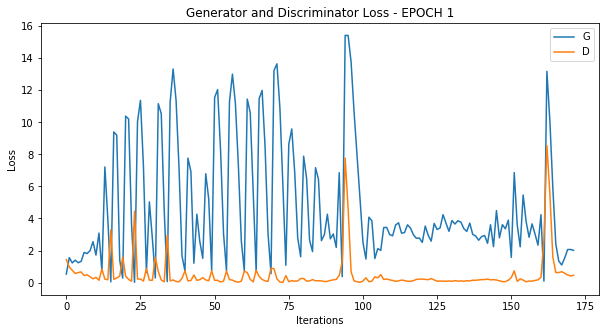

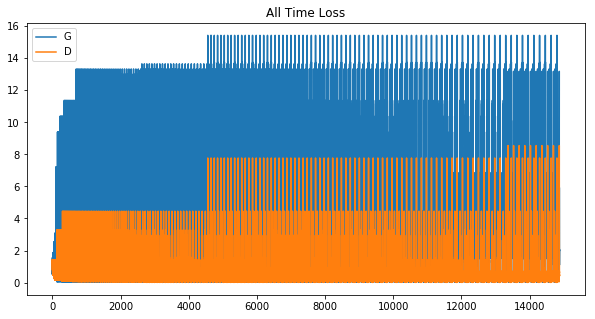

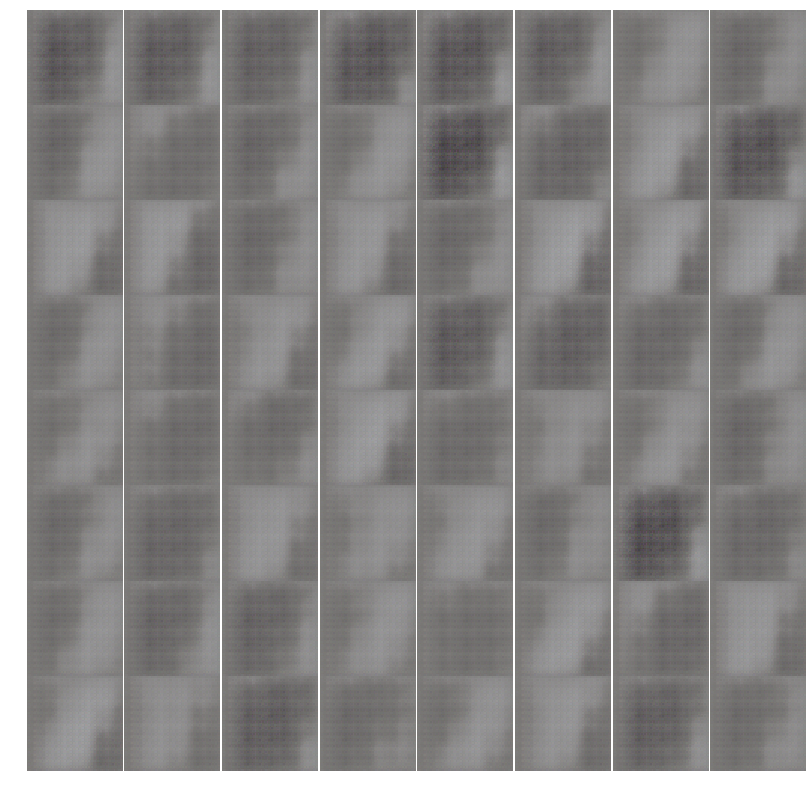

  0%|          | 1/280 [01:54<8:53:38, 114.76s/it]

Epoch: 1 computed for 114.54705929756165 sec
Gen_loss mean:  4.7044435  std:  3.7273812
Disc_loss mean:  0.5041466  std:  1.1244552
Epoch: 2 computed for 107.83023500442505 sec
Gen_loss mean:  2.7600863  std:  1.4148376


  1%|          | 2/280 [03:42<8:42:23, 112.74s/it]

Disc_loss mean:  0.44020826  std:  0.96907514
Epoch: 3 computed for 108.25032138824463 sec
Gen_loss mean:  3.020231  std:  1.778788


  1%|          | 3/280 [05:31<8:34:35, 111.46s/it]

Disc_loss mean:  0.42887667  std:  0.519306


  1%|▏         | 4/280 [07:19<8:27:46, 110.39s/it]

Epoch: 4 computed for 107.67668223381042 sec
Gen_loss mean:  2.7352  std:  1.5409119
Disc_loss mean:  0.47915587  std:  0.51838905
Epoch: 5 computed for 107.06048226356506 sec
Gen_loss mean:  2.8711863  std:  1.6766049


  2%|▏         | 5/280 [09:06<8:21:39, 109.45s/it]

Disc_loss mean:  0.5431145  std:  0.4560412
Epoch: 6 computed for 120.91699647903442 sec
Gen_loss mean:  2.7476354  std:  1.4143145


  2%|▏         | 6/280 [11:07<8:35:51, 112.96s/it]

Disc_loss mean:  0.4882518  std:  0.25303957
Epoch: 7 computed for 107.62951064109802 sec
Gen_loss mean:  2.811064  std:  1.6663797


  2%|▎         | 7/280 [12:55<8:26:59, 111.43s/it]

Disc_loss mean:  0.550854  std:  0.5118811


  3%|▎         | 8/280 [14:42<8:19:50, 110.26s/it]

Epoch: 8 computed for 107.33012652397156 sec
Gen_loss mean:  2.5458703  std:  1.2178602
Disc_loss mean:  0.42302677  std:  0.2775595
Epoch: 9 computed for 109.6270399093628 sec
Gen_loss mean:  2.5799334  std:  1.3661345


  3%|▎         | 9/280 [16:32<8:17:26, 110.13s/it]

Disc_loss mean:  0.5669746  std:  0.30867267


  4%|▎         | 10/280 [18:20<8:12:19, 109.41s/it]

Epoch: 10 computed for 107.50408124923706 sec
Gen_loss mean:  2.4374464  std:  1.2671227
Disc_loss mean:  0.5671173  std:  0.36411384
Epoch: 11 computed for 108.48120093345642 sec
Gen_loss mean:  2.130162  std:  1.1743132


  4%|▍         | 11/280 [20:09<8:09:32, 109.19s/it]

Disc_loss mean:  0.7110548  std:  0.3495044
Epoch: 12 computed for 108.09042525291443 sec
Gen_loss mean:  2.158639  std:  1.1255893


  4%|▍         | 12/280 [21:57<8:06:31, 108.93s/it]

Disc_loss mean:  0.68840337  std:  0.4065305


  5%|▍         | 13/280 [23:44<8:02:47, 108.49s/it]

Epoch: 13 computed for 107.28083682060242 sec
Gen_loss mean:  1.7940575  std:  0.7329476
Disc_loss mean:  0.76314324  std:  0.22588056
Epoch: 14 computed for 108.55279088020325 sec
Gen_loss mean:  2.0026608  std:  0.98454696


  5%|▌         | 15/280 [27:21<7:59:00, 108.45s/it]

Disc_loss mean:  0.7108757  std:  0.30932465
Epoch: 15 computed for 107.96348738670349 sec
Gen_loss mean:  2.037498  std:  0.8770067
Disc_loss mean:  0.63885486  std:  0.3380326
Epoch: 16 computed for 107.60945844650269 sec
Gen_loss mean:  1.9840513  std:  0.9516389


  6%|▌         | 16/280 [29:09<7:56:21, 108.26s/it]

Disc_loss mean:  0.69959384  std:  0.31681576
Epoch: 17 computed for 108.31995463371277 sec
Gen_loss mean:  2.0074892  std:  0.9304381


  6%|▌         | 17/280 [30:58<7:54:55, 108.35s/it]

Disc_loss mean:  0.6680765  std:  0.35162193


  6%|▋         | 18/280 [32:46<7:53:03, 108.33s/it]

Epoch: 18 computed for 108.08841347694397 sec
Gen_loss mean:  1.9675285  std:  1.0144508
Disc_loss mean:  0.7458414  std:  0.3963894
Epoch: 19 computed for 107.87246131896973 sec
Gen_loss mean:  1.7906582  std:  0.91275024


  7%|▋         | 19/280 [34:34<7:50:57, 108.27s/it]

Disc_loss mean:  0.809792  std:  0.34231246
Epoch: 20 computed for 108.74440503120422 sec
Gen_loss mean:  1.7838937  std:  0.9020493


  7%|▋         | 20/280 [36:23<7:50:04, 108.48s/it]

Disc_loss mean:  0.7883815  std:  0.3295633


  8%|▊         | 21/280 [38:12<7:48:19, 108.49s/it]

Epoch: 21 computed for 108.32045340538025 sec
Gen_loss mean:  1.71338  std:  0.81474245
Disc_loss mean:  0.79745483  std:  0.3191255
Epoch: 22 computed for 107.60462856292725 sec
Gen_loss mean:  1.6144762  std:  0.69565374


  8%|▊         | 22/280 [40:00<7:45:38, 108.29s/it]

Disc_loss mean:  0.8295478  std:  0.26344606
Epoch: 23 computed for 108.84732794761658 sec
Gen_loss mean:  1.6518892  std:  0.76500607


  8%|▊         | 23/280 [41:49<7:44:51, 108.53s/it]

Disc_loss mean:  0.82188946  std:  0.19787458
Epoch: 24 computed for 108.46619439125061 sec
Gen_loss mean:  1.6808876  std:  0.74885577


  9%|▊         | 24/280 [43:37<7:43:16, 108.58s/it]

Disc_loss mean:  0.81582475  std:  0.3001481
Epoch: 25 computed for 108.28416681289673 sec
Gen_loss mean:  1.5537066  std:  0.68603665


  9%|▉         | 25/280 [45:26<7:41:21, 108.56s/it]

Disc_loss mean:  0.8888346  std:  0.31570327
Epoch: 26 computed for 108.18346381187439 sec
Gen_loss mean:  1.5948148  std:  0.7765232


  9%|▉         | 26/280 [47:14<7:39:22, 108.52s/it]

Disc_loss mean:  0.8842375  std:  0.34289464
Epoch: 27 computed for 108.73370122909546 sec
Gen_loss mean:  1.5041366  std:  0.6251838


 10%|▉         | 27/280 [49:03<7:38:08, 108.65s/it]

Disc_loss mean:  0.8516198  std:  0.2766423
Epoch: 28 computed for 108.84736180305481 sec
Gen_loss mean:  1.527553  std:  0.63981575


 10%|█         | 28/280 [50:52<7:36:50, 108.77s/it]

Disc_loss mean:  0.87765574  std:  0.3471269


 10%|█         | 29/280 [52:41<7:35:03, 108.78s/it]

Epoch: 29 computed for 108.59242916107178 sec
Gen_loss mean:  1.6542894  std:  0.7484754
Disc_loss mean:  0.8207544  std:  0.28395408


 11%|█         | 30/280 [54:29<7:32:23, 108.57s/it]

Epoch: 30 computed for 107.88193202018738 sec
Gen_loss mean:  1.8003504  std:  0.8982547
Disc_loss mean:  0.7793923  std:  0.32835037
Epoch: 31 computed for 108.92549753189087 sec
Gen_loss mean:  1.5915602  std:  0.69536513


 11%|█         | 31/280 [56:18<7:31:16, 108.74s/it]

Disc_loss mean:  0.84095  std:  0.31057617
Epoch: 32 computed for 108.57566213607788 sec
Gen_loss mean:  1.4994789  std:  0.5764439


 11%|█▏        | 32/280 [58:07<7:29:31, 108.76s/it]

Disc_loss mean:  0.83769244  std:  0.34700254
Epoch: 33 computed for 107.75397658348083 sec
Gen_loss mean:  1.5502144  std:  0.6274782


 12%|█▏        | 33/280 [59:55<7:26:44, 108.52s/it]

Disc_loss mean:  0.81997025  std:  0.24311478
Epoch: 34 computed for 108.89022254943848 sec
Gen_loss mean:  1.5350175  std:  0.71198946


 12%|█▏        | 34/280 [1:01:44<7:25:41, 108.71s/it]

Disc_loss mean:  0.87254673  std:  0.26850262
Epoch: 35 computed for 108.57306504249573 sec
Gen_loss mean:  1.5281218  std:  0.62588406


 12%|█▎        | 35/280 [1:03:33<7:23:58, 108.73s/it]

Disc_loss mean:  0.8379679  std:  0.269009
Epoch: 36 computed for 108.87858319282532 sec
Gen_loss mean:  1.5096105  std:  0.6393945


 13%|█▎        | 36/280 [1:05:22<7:22:38, 108.85s/it]

Disc_loss mean:  0.8485026  std:  0.2911872


 13%|█▎        | 37/280 [1:07:11<7:20:30, 108.77s/it]

Epoch: 37 computed for 108.37043499946594 sec
Gen_loss mean:  1.5651282  std:  0.6577942
Disc_loss mean:  0.7955224  std:  0.25001827
Epoch: 38 computed for 108.6409637928009 sec
Gen_loss mean:  1.5156282  std:  0.7100879


 14%|█▎        | 38/280 [1:08:59<7:18:47, 108.79s/it]

Disc_loss mean:  0.8689385  std:  0.30402416
Epoch: 39 computed for 108.64602184295654 sec
Gen_loss mean:  1.4916924  std:  0.66982985


 14%|█▍        | 39/280 [1:10:48<7:17:03, 108.81s/it]

Disc_loss mean:  0.8861309  std:  0.44870108


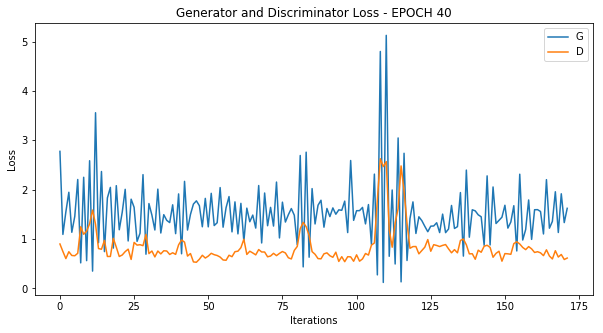

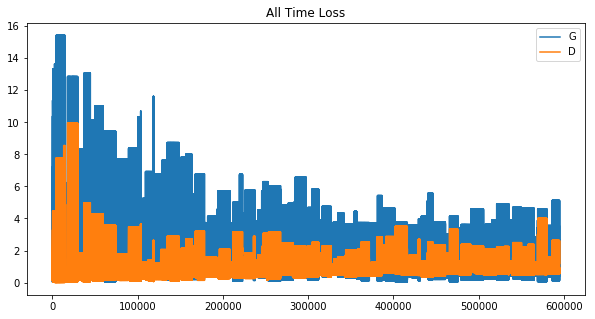

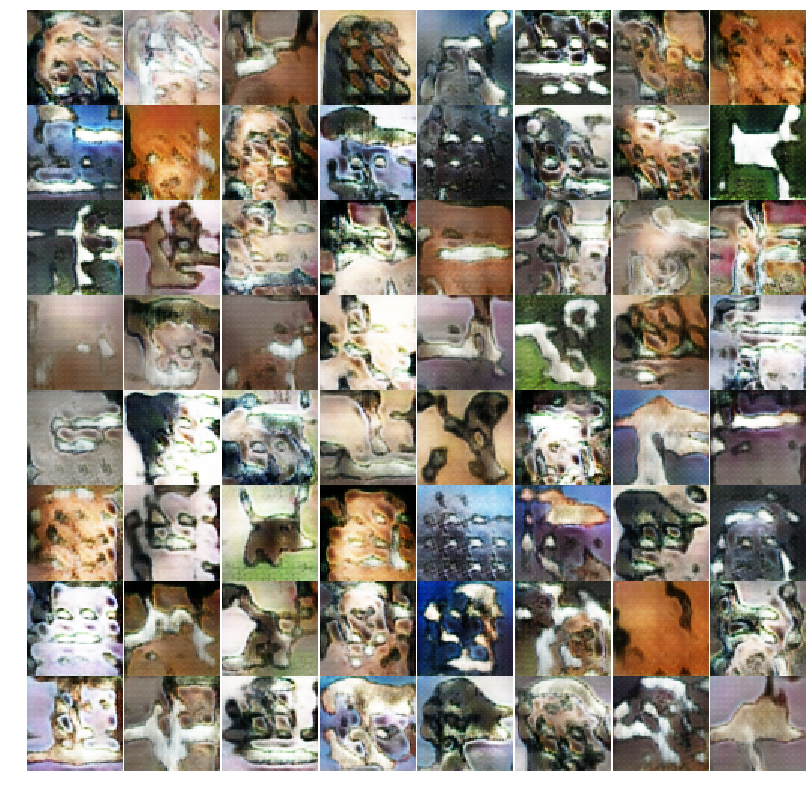

 14%|█▍        | 40/280 [1:12:43<7:22:29, 110.62s/it]

Epoch: 40 computed for 114.64481282234192 sec
Gen_loss mean:  1.5226034  std:  0.66297865
Disc_loss mean:  0.8370104  std:  0.3444807
Epoch: 41 computed for 108.55662274360657 sec
Gen_loss mean:  1.5428646  std:  0.6808819


 15%|█▍        | 41/280 [1:14:32<7:18:25, 110.07s/it]

Disc_loss mean:  0.81766725  std:  0.3061321
Epoch: 42 computed for 109.21520400047302 sec
Gen_loss mean:  1.5348997  std:  0.67751884


 15%|█▌        | 42/280 [1:16:21<7:15:50, 109.87s/it]

Disc_loss mean:  0.8509656  std:  0.33012837
Epoch: 43 computed for 108.13499522209167 sec
Gen_loss mean:  1.6007084  std:  0.6460093


 15%|█▌        | 43/280 [1:18:10<7:12:11, 109.42s/it]

Disc_loss mean:  0.76162726  std:  0.23824954
Epoch: 44 computed for 108.78854751586914 sec
Gen_loss mean:  1.5628797  std:  0.7422819


 16%|█▌        | 44/280 [1:19:59<7:09:53, 109.29s/it]

Disc_loss mean:  0.86444783  std:  0.41522208
Epoch: 45 computed for 109.01299977302551 sec
Gen_loss mean:  1.5245818  std:  0.54234684


 16%|█▌        | 45/280 [1:21:48<7:07:59, 109.27s/it]

Disc_loss mean:  0.73751533  std:  0.14811145
Epoch: 46 computed for 108.54785060882568 sec
Gen_loss mean:  1.6159166  std:  0.8257217


 16%|█▋        | 46/280 [1:23:37<7:05:34, 109.12s/it]

Disc_loss mean:  0.8382254  std:  0.40446132
Epoch: 47 computed for 108.43655347824097 sec
Gen_loss mean:  1.5352813  std:  0.6471908


 17%|█▋        | 47/280 [1:25:25<7:03:12, 108.98s/it]

Disc_loss mean:  0.8041671  std:  0.30180344


 17%|█▋        | 48/280 [1:27:15<7:01:42, 109.06s/it]

Epoch: 48 computed for 109.05469298362732 sec
Gen_loss mean:  1.5710613  std:  0.626218
Disc_loss mean:  0.756698  std:  0.23127605
Epoch: 49 computed for 108.60612416267395 sec
Gen_loss mean:  1.5599543  std:  0.71965337
Disc_loss mean:  0.7958701  std:  0.28945285


 18%|█▊        | 49/280 [1:29:03<6:59:36, 108.99s/it]

Epoch: 50 computed for 109.09782814979553 sec
Gen_loss mean:  1.5320492  std:  0.6796092


 18%|█▊        | 50/280 [1:30:53<6:58:11, 109.09s/it]

Disc_loss mean:  0.8095185  std:  0.22899172
Epoch: 51 computed for 109.05858898162842 sec
Gen_loss mean:  1.5440539  std:  0.70560855


 18%|█▊        | 51/280 [1:32:42<6:56:34, 109.15s/it]

Disc_loss mean:  0.8100893  std:  0.2685128
Epoch: 52 computed for 109.08013725280762 sec
Gen_loss mean:  1.480077  std:  0.55627286


 19%|█▊        | 52/280 [1:34:31<6:54:55, 109.19s/it]

Disc_loss mean:  0.79778296  std:  0.24882525
Epoch: 53 computed for 109.30994081497192 sec
Gen_loss mean:  1.5295863  std:  0.5760102


 19%|█▉        | 53/280 [1:36:21<6:53:29, 109.29s/it]

Disc_loss mean:  0.7537339  std:  0.23946801
Epoch: 54 computed for 108.86341571807861 sec
Gen_loss mean:  1.5245205  std:  0.750967


 19%|█▉        | 54/280 [1:38:10<6:51:25, 109.23s/it]

Disc_loss mean:  0.885233  std:  0.4780122
Epoch: 55 computed for 109.29907441139221 sec
Gen_loss mean:  1.5121526  std:  0.61322355


 20%|█▉        | 55/280 [1:39:59<6:49:55, 109.31s/it]

Disc_loss mean:  0.78021365  std:  0.22354704
Epoch: 56 computed for 109.18359279632568 sec
Gen_loss mean:  1.5324143  std:  0.68291706


 20%|██        | 56/280 [1:41:49<6:48:12, 109.34s/it]

Disc_loss mean:  0.80158377  std:  0.21894455
Epoch: 57 computed for 108.38478684425354 sec
Gen_loss mean:  1.5352528  std:  0.6591619


 20%|██        | 57/280 [1:43:37<6:45:33, 109.12s/it]

Disc_loss mean:  0.80493486  std:  0.27327755
Epoch: 58 computed for 109.15994071960449 sec
Gen_loss mean:  1.5519505  std:  0.6512418


 21%|██        | 58/280 [1:45:27<6:44:01, 109.20s/it]

Disc_loss mean:  0.7651002  std:  0.30609015


 21%|██        | 59/280 [1:47:17<6:42:47, 109.35s/it]

Epoch: 59 computed for 109.51205611228943 sec
Gen_loss mean:  1.5213122  std:  0.6964556
Disc_loss mean:  0.8285256  std:  0.28411037
Epoch: 60 computed for 108.29867267608643 sec
Gen_loss mean:  1.5130912  std:  0.57789177


 21%|██▏       | 60/280 [1:49:05<6:40:02, 109.10s/it]

Disc_loss mean:  0.7788954  std:  0.31873325
Epoch: 61 computed for 109.43845534324646 sec
Gen_loss mean:  1.5399892  std:  0.70192546


 22%|██▏       | 61/280 [1:50:55<6:38:50, 109.27s/it]

Disc_loss mean:  0.82379186  std:  0.29082042
Epoch: 62 computed for 108.87795162200928 sec
Gen_loss mean:  1.5075893  std:  0.55901796


 22%|██▏       | 62/280 [1:52:44<6:36:50, 109.22s/it]

Disc_loss mean:  0.7532192  std:  0.17361599
Epoch: 63 computed for 108.85964488983154 sec
Gen_loss mean:  1.5115784  std:  0.6460883


 22%|██▎       | 63/280 [1:54:33<6:34:51, 109.18s/it]

Disc_loss mean:  0.8014333  std:  0.3389553
Epoch: 64 computed for 109.58745980262756 sec
Gen_loss mean:  1.5297449  std:  0.67519766


 23%|██▎       | 64/280 [1:56:23<6:33:42, 109.37s/it]

Disc_loss mean:  0.8013693  std:  0.22340292
Epoch: 65 computed for 108.84958553314209 sec
Gen_loss mean:  1.5208039  std:  0.73465407


 23%|██▎       | 65/280 [1:58:12<6:31:34, 109.28s/it]

Disc_loss mean:  0.8492382  std:  0.39950258
Epoch: 66 computed for 109.14290118217468 sec
Gen_loss mean:  1.5364976  std:  0.5741578


 24%|██▎       | 66/280 [2:00:01<6:29:50, 109.30s/it]

Disc_loss mean:  0.72441155  std:  0.19001162
Epoch: 67 computed for 109.42787623405457 sec
Gen_loss mean:  1.510594  std:  0.7361045


 24%|██▍       | 67/280 [2:01:51<6:28:24, 109.41s/it]

Disc_loss mean:  0.8735866  std:  0.48465154
Epoch: 68 computed for 108.91331076622009 sec
Gen_loss mean:  1.5246797  std:  0.65420336


 24%|██▍       | 68/280 [2:03:40<6:26:16, 109.32s/it]

Disc_loss mean:  0.7924467  std:  0.33336017
Epoch: 69 computed for 108.81125521659851 sec
Gen_loss mean:  1.5194117  std:  0.5713894


 25%|██▍       | 69/280 [2:05:29<6:24:08, 109.23s/it]

Disc_loss mean:  0.74608153  std:  0.21844481
Epoch: 70 computed for 109.08859634399414 sec
Gen_loss mean:  1.5374043  std:  0.65241516


 25%|██▌       | 70/280 [2:07:18<6:22:24, 109.26s/it]

Disc_loss mean:  0.785236  std:  0.292734
Epoch: 71 computed for 108.76321029663086 sec
Gen_loss mean:  1.5393986  std:  0.5984515


 25%|██▌       | 71/280 [2:09:07<6:20:19, 109.18s/it]

Disc_loss mean:  0.75244033  std:  0.3162005
Epoch: 72 computed for 109.19174337387085 sec
Gen_loss mean:  1.5398014  std:  0.616602


 26%|██▌       | 72/280 [2:10:57<6:18:43, 109.25s/it]

Disc_loss mean:  0.7401287  std:  0.2008225
Epoch: 73 computed for 109.25059485435486 sec
Gen_loss mean:  1.4753959  std:  0.7579756


 26%|██▌       | 73/280 [2:12:46<6:17:09, 109.32s/it]

Disc_loss mean:  0.95084006  std:  0.61850965
Epoch: 74 computed for 107.38784313201904 sec
Gen_loss mean:  1.5343958  std:  0.6181772


 26%|██▋       | 74/280 [2:14:34<6:13:34, 108.81s/it]

Disc_loss mean:  0.75483227  std:  0.23745485
Epoch: 75 computed for 108.40101623535156 sec
Gen_loss mean:  1.5370505  std:  0.6370707


 27%|██▋       | 75/280 [2:16:22<6:11:33, 108.75s/it]

Disc_loss mean:  0.77461153  std:  0.3775918
Epoch: 76 computed for 107.31036043167114 sec
Gen_loss mean:  1.5222881  std:  0.59416664


 27%|██▋       | 76/280 [2:18:10<6:08:29, 108.38s/it]

Disc_loss mean:  0.7558002  std:  0.29906625
Epoch: 77 computed for 106.60688018798828 sec
Gen_loss mean:  1.517436  std:  0.5958808


 28%|██▊       | 77/280 [2:19:57<6:05:06, 107.91s/it]

Disc_loss mean:  0.7844656  std:  0.41671664


 28%|██▊       | 78/280 [2:21:44<6:02:59, 107.82s/it]

Epoch: 78 computed for 107.40131425857544 sec
Gen_loss mean:  1.5506046  std:  0.61122966
Disc_loss mean:  0.75221413  std:  0.27036515


 28%|██▊       | 79/280 [2:23:32<6:00:38, 107.66s/it]

Epoch: 79 computed for 107.0655210018158 sec
Gen_loss mean:  1.6012512  std:  0.7199767
Disc_loss mean:  0.75075954  std:  0.2823976


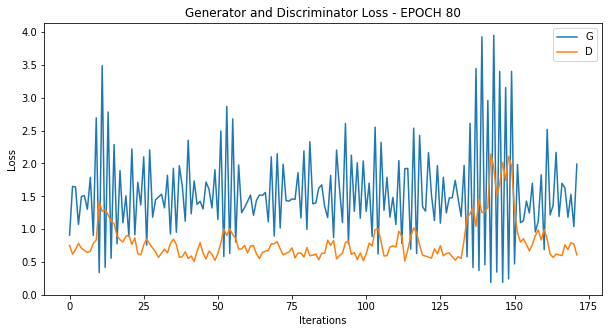

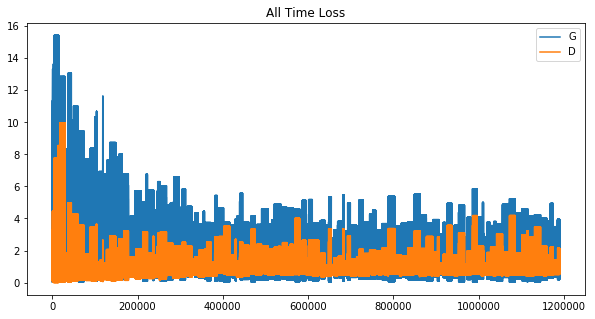

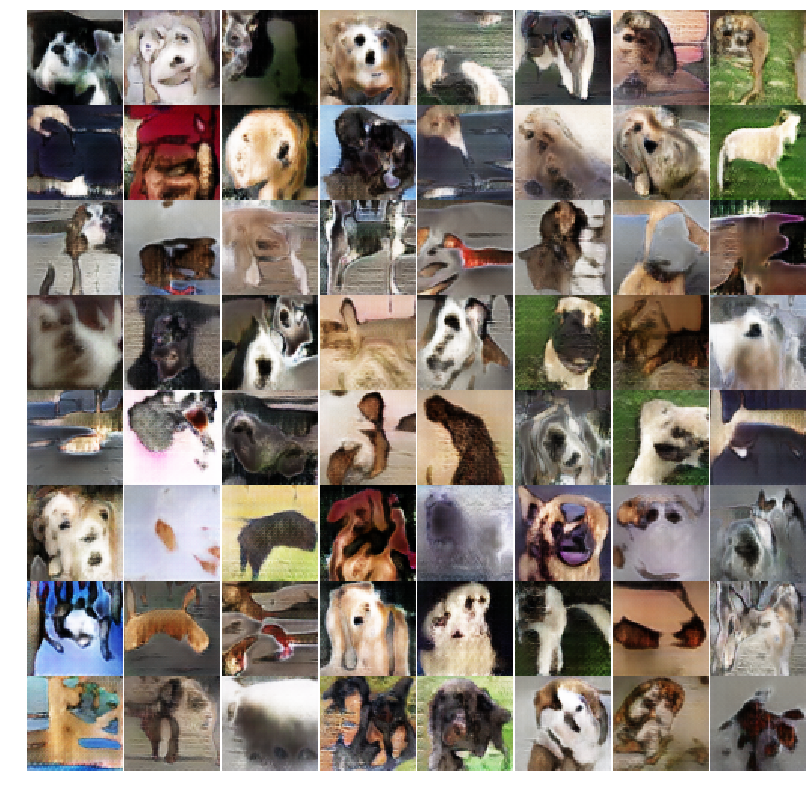

 29%|██▊       | 80/280 [2:25:26<6:05:34, 109.67s/it]

Epoch: 80 computed for 114.15778422355652 sec
Gen_loss mean:  1.5476211  std:  0.7108552
Disc_loss mean:  0.8138468  std:  0.310286
Epoch: 81 computed for 107.7486834526062 sec
Gen_loss mean:  1.5206251  std:  0.53851855


 29%|██▉       | 81/280 [2:27:14<6:02:07, 109.18s/it]

Disc_loss mean:  0.72005266  std:  0.22197875


 29%|██▉       | 82/280 [2:29:02<5:58:38, 108.68s/it]

Epoch: 82 computed for 107.30068683624268 sec
Gen_loss mean:  1.5620614  std:  0.642626
Disc_loss mean:  0.76445967  std:  0.32865465
Epoch: 83 computed for 107.11027455329895 sec
Gen_loss mean:  1.5310421  std:  0.63671654


 30%|██▉       | 83/280 [2:30:49<5:55:30, 108.27s/it]

Disc_loss mean:  0.7874798  std:  0.44674933
Epoch: 84 computed for 108.3669753074646 sec
Gen_loss mean:  1.536152  std:  0.6144281


 30%|███       | 84/280 [2:32:37<5:53:59, 108.37s/it]

Disc_loss mean:  0.74352974  std:  0.23539415


 30%|███       | 85/280 [2:34:25<5:50:59, 108.00s/it]

Epoch: 85 computed for 106.93809628486633 sec
Gen_loss mean:  1.5748407  std:  0.6475663
Disc_loss mean:  0.7280588  std:  0.22688326
Epoch: 86 computed for 107.03835940361023 sec
Gen_loss mean:  1.6037819  std:  0.7670804


 31%|███       | 86/280 [2:36:12<5:48:29, 107.78s/it]

Disc_loss mean:  0.77083564  std:  0.26175526
Epoch: 87 computed for 107.84358143806458 sec
Gen_loss mean:  1.5233731  std:  0.73326343


 31%|███       | 87/280 [2:38:00<5:46:57, 107.86s/it]

Disc_loss mean:  0.87663144  std:  0.638686


 31%|███▏      | 88/280 [2:39:47<5:44:02, 107.51s/it]

Epoch: 88 computed for 106.49435210227966 sec
Gen_loss mean:  1.4783891  std:  0.47146624
Disc_loss mean:  0.7226332  std:  0.1755906


 32%|███▏      | 89/280 [2:41:34<5:42:20, 107.54s/it]

Epoch: 89 computed for 107.40770864486694 sec
Gen_loss mean:  1.5523139  std:  0.6150557
Disc_loss mean:  0.7337488  std:  0.23263939
Epoch: 90 computed for 106.92250633239746 sec
Gen_loss mean:  1.4002781  std:  0.6543905


 32%|███▏      | 90/280 [2:43:21<5:40:10, 107.43s/it]

Disc_loss mean:  0.9568084  std:  0.585466


 32%|███▎      | 91/280 [2:45:08<5:37:48, 107.24s/it]

Epoch: 91 computed for 106.59874606132507 sec
Gen_loss mean:  1.5140061  std:  0.49435326
Disc_loss mean:  0.69627315  std:  0.124042325


 33%|███▎      | 92/280 [2:46:56<5:36:37, 107.43s/it]

Epoch: 92 computed for 107.68528270721436 sec
Gen_loss mean:  1.5302955  std:  0.6336288
Disc_loss mean:  0.7844176  std:  0.3653269
Epoch: 93 computed for 106.90317606925964 sec
Gen_loss mean:  1.4745263  std:  0.63761556


 33%|███▎      | 93/280 [2:48:43<5:34:33, 107.34s/it]

Disc_loss mean:  0.840307  std:  0.5142544


 34%|███▎      | 94/280 [2:50:30<5:32:23, 107.22s/it]

Epoch: 94 computed for 106.7461838722229 sec
Gen_loss mean:  1.5400043  std:  0.56011266
Disc_loss mean:  0.7294933  std:  0.29305133


 34%|███▍      | 95/280 [2:52:18<5:31:29, 107.51s/it]

Epoch: 95 computed for 107.97876262664795 sec
Gen_loss mean:  1.2867286  std:  0.70349854
Disc_loss mean:  1.090028  std:  0.5949164


 34%|███▍      | 96/280 [2:54:05<5:29:18, 107.38s/it]

Epoch: 96 computed for 106.87718987464905 sec
Gen_loss mean:  1.527776  std:  0.48196772
Disc_loss mean:  0.67655724  std:  0.12530428


 35%|███▍      | 97/280 [2:55:52<5:26:46, 107.14s/it]

Epoch: 97 computed for 106.37430453300476 sec
Gen_loss mean:  1.5547558  std:  0.6487496
Disc_loss mean:  0.77267814  std:  0.29487425


 35%|███▌      | 98/280 [2:57:40<5:26:06, 107.51s/it]

Epoch: 98 computed for 108.16488289833069 sec
Gen_loss mean:  1.5205241  std:  0.53844965
Disc_loss mean:  0.7466608  std:  0.37045422
Epoch: 99 computed for 107.21954226493835 sec
Gen_loss mean:  1.5754267  std:  0.677621


 35%|███▌      | 99/280 [2:59:28<5:24:15, 107.49s/it]

Disc_loss mean:  0.7570857  std:  0.38773525
Saved temporary images for evaluation.
FID: 90.59263
distance: 1.00000
MiFID: 90.59263
Removed temporary image directory.
Epoch: 100 computed for 555.4754049777985 sec
Gen_loss mean:  1.5930438  std:  0.67532605


 36%|███▌      | 100/280 [3:08:44<12:05:52, 241.96s/it]

Disc_loss mean:  0.7173267  std:  0.22828944
Epoch: 101 computed for 108.44407486915588 sec
Gen_loss mean:  1.5442784  std:  0.5672409


 36%|███▌      | 101/280 [3:10:32<10:02:32, 201.97s/it]

Disc_loss mean:  0.7263026  std:  0.2995379
Epoch: 102 computed for 108.35805130004883 sec
Gen_loss mean:  1.4389151  std:  0.7460232


 36%|███▋      | 102/280 [3:12:21<8:36:04, 173.96s/it] 

Disc_loss mean:  0.94502205  std:  0.5886998
Epoch: 103 computed for 107.6692955493927 sec
Gen_loss mean:  1.5167193  std:  0.5130694


 37%|███▋      | 103/280 [3:14:09<7:34:41, 154.13s/it]

Disc_loss mean:  0.71147877  std:  0.1804595


 37%|███▋      | 104/280 [3:15:56<6:51:10, 140.17s/it]

Epoch: 104 computed for 107.3895583152771 sec
Gen_loss mean:  1.5393136  std:  0.6068762
Disc_loss mean:  0.7552476  std:  0.35388416
Epoch: 105 computed for 108.20471024513245 sec
Gen_loss mean:  1.4784521  std:  0.56306934


 38%|███▊      | 105/280 [3:17:45<6:21:04, 130.65s/it]

Disc_loss mean:  0.81947523  std:  0.5276535
Epoch: 106 computed for 107.43394780158997 sec
Gen_loss mean:  1.5308617  std:  0.5654123


 38%|███▊      | 106/280 [3:19:32<5:58:53, 123.76s/it]

Disc_loss mean:  0.7336361  std:  0.27247372


 38%|███▊      | 107/280 [3:21:21<5:43:45, 119.22s/it]

Epoch: 107 computed for 108.43780183792114 sec
Gen_loss mean:  1.4963921  std:  0.634776
Disc_loss mean:  0.8254744  std:  0.43007636


 39%|███▊      | 108/280 [3:23:11<5:33:33, 116.36s/it]

Epoch: 108 computed for 109.46681141853333 sec
Gen_loss mean:  1.5160959  std:  0.6592993
Disc_loss mean:  0.83133966  std:  0.41905573


 39%|███▉      | 109/280 [3:25:00<5:25:10, 114.10s/it]

Epoch: 109 computed for 108.6179461479187 sec
Gen_loss mean:  1.5664127  std:  0.5202645
Disc_loss mean:  0.67150426  std:  0.14255705


 39%|███▉      | 110/280 [3:26:48<5:18:41, 112.48s/it]

Epoch: 110 computed for 108.49379444122314 sec
Gen_loss mean:  1.5554018  std:  0.5334281
Disc_loss mean:  0.6791681  std:  0.15177548


 40%|███▉      | 111/280 [3:28:37<5:14:01, 111.49s/it]

Epoch: 111 computed for 108.9781436920166 sec
Gen_loss mean:  1.5700287  std:  0.6788285
Disc_loss mean:  0.77860665  std:  0.38916913
Epoch: 112 computed for 107.67534947395325 sec
Gen_loss mean:  1.4911993  std:  0.6562315


 40%|████      | 112/280 [3:30:25<5:09:10, 110.42s/it]

Disc_loss mean:  0.84162164  std:  0.49852595
Epoch: 113 computed for 108.39011025428772 sec
Gen_loss mean:  1.5105917  std:  0.587634


 40%|████      | 113/280 [3:32:14<5:05:51, 109.89s/it]

Disc_loss mean:  0.7640897  std:  0.30946916


 41%|████      | 114/280 [3:34:02<5:02:35, 109.37s/it]

Epoch: 114 computed for 107.94490885734558 sec
Gen_loss mean:  1.5575958  std:  0.4609277
Disc_loss mean:  0.64415544  std:  0.12337717


 41%|████      | 115/280 [3:35:50<4:59:14, 108.81s/it]

Epoch: 115 computed for 107.31234884262085 sec
Gen_loss mean:  1.5482643  std:  0.7013638
Disc_loss mean:  0.81887776  std:  0.47708094


 41%|████▏     | 116/280 [3:37:38<4:56:44, 108.57s/it]

Epoch: 116 computed for 107.7845983505249 sec
Gen_loss mean:  1.561637  std:  0.5846441
Disc_loss mean:  0.7006373  std:  0.20066114
Epoch: 117 computed for 108.08750319480896 sec
Gen_loss mean:  1.5489899  std:  0.6587129


 42%|████▏     | 117/280 [3:39:26<4:54:43, 108.49s/it]

Disc_loss mean:  0.7723471  std:  0.36712992
Epoch: 118 computed for 107.45135951042175 sec
Gen_loss mean:  1.542308  std:  0.5542825


 42%|████▏     | 118/280 [3:41:14<4:52:15, 108.24s/it]

Disc_loss mean:  0.71525407  std:  0.2673938


 42%|████▎     | 119/280 [3:43:02<4:50:36, 108.30s/it]

Epoch: 119 computed for 108.23687553405762 sec
Gen_loss mean:  1.5807965  std:  0.6034729
Disc_loss mean:  0.7000435  std:  0.20512865


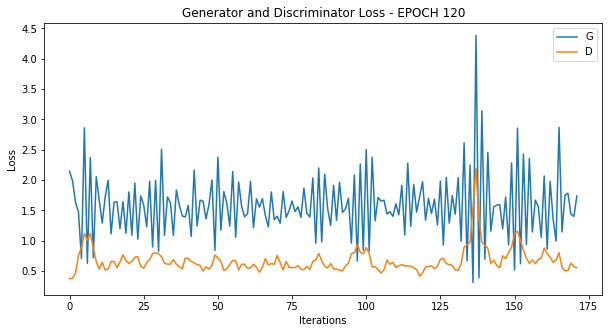

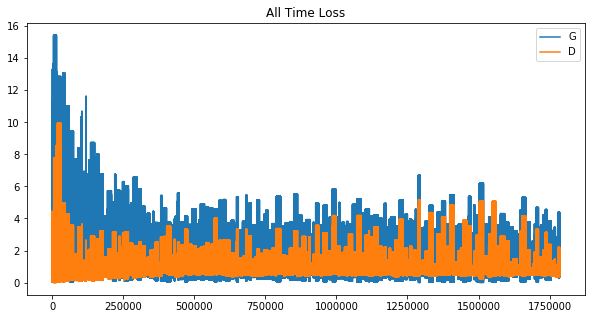

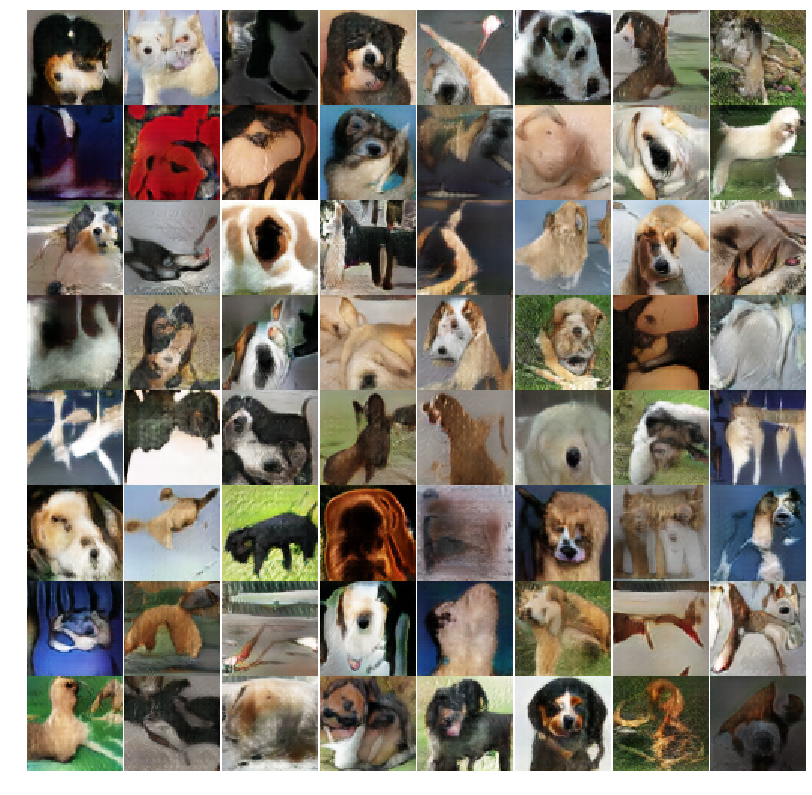

 43%|████▎     | 120/280 [3:44:58<4:55:15, 110.72s/it]

Epoch: 120 computed for 116.15440392494202 sec
Gen_loss mean:  1.5761827  std:  0.54820496
Disc_loss mean:  0.6737553  std:  0.20240517
Epoch: 121 computed for 108.03189659118652 sec
Gen_loss mean:  1.5132829  std:  0.69149506


 43%|████▎     | 121/280 [3:46:47<4:51:26, 109.97s/it]

Disc_loss mean:  0.8688325  std:  0.51199275


 44%|████▎     | 122/280 [3:48:35<4:48:28, 109.55s/it]

Epoch: 122 computed for 108.34512090682983 sec
Gen_loss mean:  1.5611972  std:  0.49699634
Disc_loss mean:  0.66731167  std:  0.20254405


 44%|████▍     | 123/280 [3:50:24<4:45:43, 109.19s/it]

Epoch: 123 computed for 108.15854263305664 sec
Gen_loss mean:  1.428116  std:  0.6691655
Disc_loss mean:  0.93261975  std:  0.558872
Epoch: 124 computed for 108.05386567115784 sec
Gen_loss mean:  1.5648975  std:  0.5449789


 44%|████▍     | 124/280 [3:52:12<4:43:11, 108.92s/it]

Disc_loss mean:  0.68772274  std:  0.2537906


 45%|████▍     | 125/280 [3:54:00<4:40:58, 108.77s/it]

Epoch: 125 computed for 108.20630502700806 sec
Gen_loss mean:  1.5525161  std:  0.5791878
Disc_loss mean:  0.70233315  std:  0.18277904


 45%|████▌     | 126/280 [3:55:48<4:38:36, 108.55s/it]

Epoch: 126 computed for 107.84946703910828 sec
Gen_loss mean:  1.5386908  std:  0.68876094
Disc_loss mean:  0.8129349  std:  0.44650826


 45%|████▌     | 127/280 [3:57:37<4:36:53, 108.58s/it]

Epoch: 127 computed for 108.4574248790741 sec
Gen_loss mean:  1.5132356  std:  0.5450934
Disc_loss mean:  0.7424354  std:  0.31211758
Epoch: 128 computed for 108.21371793746948 sec
Gen_loss mean:  1.5812956  std:  0.5949708


 46%|████▌     | 129/280 [4:01:13<4:32:26, 108.26s/it]

Disc_loss mean:  0.6876081  std:  0.18182258
Epoch: 129 computed for 107.39956068992615 sec
Gen_loss mean:  1.5955625  std:  0.58306736
Disc_loss mean:  0.67951924  std:  0.17289834
Epoch: 130 computed for 108.35440492630005 sec
Gen_loss mean:  1.5811611  std:  0.65894884


 46%|████▋     | 130/280 [4:03:02<4:30:52, 108.35s/it]

Disc_loss mean:  0.7394927  std:  0.32838526


 47%|████▋     | 131/280 [4:04:50<4:29:09, 108.38s/it]

Epoch: 131 computed for 108.25716209411621 sec
Gen_loss mean:  1.49613  std:  0.73723364
Disc_loss mean:  0.9074959  std:  0.5490156


 47%|████▋     | 132/280 [4:06:38<4:27:20, 108.39s/it]

Epoch: 132 computed for 108.1804883480072 sec
Gen_loss mean:  1.4968901  std:  0.4053402
Disc_loss mean:  0.6803291  std:  0.1583654


 48%|████▊     | 133/280 [4:08:26<4:24:55, 108.13s/it]

Epoch: 133 computed for 107.33393478393555 sec
Gen_loss mean:  1.5671697  std:  0.51516294
Disc_loss mean:  0.6641483  std:  0.20285907
Epoch: 134 computed for 108.21768689155579 sec
Gen_loss mean:  1.5464038  std:  0.6717769


 48%|████▊     | 134/280 [4:10:14<4:23:20, 108.22s/it]

Disc_loss mean:  0.80838245  std:  0.5145255
Epoch: 135 computed for 107.35679507255554 sec
Gen_loss mean:  1.5725119  std:  0.5527526


 48%|████▊     | 135/280 [4:12:02<4:21:04, 108.03s/it]

Disc_loss mean:  0.69194686  std:  0.25902992


 49%|████▊     | 136/280 [4:13:50<4:19:35, 108.16s/it]

Epoch: 136 computed for 108.25327181816101 sec
Gen_loss mean:  1.5708998  std:  0.6373819
Disc_loss mean:  0.7444783  std:  0.31043628


 49%|████▉     | 137/280 [4:15:39<4:18:07, 108.31s/it]

Epoch: 137 computed for 108.44177675247192 sec
Gen_loss mean:  1.5790279  std:  0.47290954
Disc_loss mean:  0.63063246  std:  0.12172753
Epoch: 138 computed for 107.63372325897217 sec
Gen_loss mean:  1.5706064  std:  0.61790806


 49%|████▉     | 138/280 [4:17:27<4:16:00, 108.17s/it]

Disc_loss mean:  0.7548248  std:  0.42646575


 50%|████▉     | 139/280 [4:19:15<4:13:53, 108.04s/it]

Epoch: 139 computed for 107.50476169586182 sec
Gen_loss mean:  1.5656716  std:  0.56286603
Disc_loss mean:  0.70187736  std:  0.23768567


 50%|█████     | 140/280 [4:21:03<4:12:29, 108.21s/it]

Epoch: 140 computed for 108.40259289741516 sec
Gen_loss mean:  1.5646043  std:  0.5778884
Disc_loss mean:  0.708839  std:  0.26203626


 50%|█████     | 141/280 [4:22:51<4:10:34, 108.16s/it]

Epoch: 141 computed for 107.84441828727722 sec
Gen_loss mean:  1.585431  std:  0.631707
Disc_loss mean:  0.71341074  std:  0.2497149


 51%|█████     | 142/280 [4:24:39<4:08:44, 108.15s/it]

Epoch: 142 computed for 107.91578960418701 sec
Gen_loss mean:  1.5760479  std:  0.6774731
Disc_loss mean:  0.761105  std:  0.3481484


 51%|█████     | 143/280 [4:26:27<4:06:50, 108.10s/it]

Epoch: 143 computed for 107.79598760604858 sec
Gen_loss mean:  1.5820937  std:  0.57059234
Disc_loss mean:  0.6849187  std:  0.23965842
Epoch: 144 computed for 108.37680506706238 sec
Gen_loss mean:  1.5460037  std:  0.60492015


 51%|█████▏    | 144/280 [4:28:16<4:05:21, 108.25s/it]

Disc_loss mean:  0.76580864  std:  0.46383184
Epoch: 145 computed for 107.94648051261902 sec
Gen_loss mean:  1.6060859  std:  0.54695433


 52%|█████▏    | 145/280 [4:30:04<4:03:30, 108.23s/it]

Disc_loss mean:  0.6435207  std:  0.16745363


 52%|█████▏    | 146/280 [4:31:52<4:01:28, 108.12s/it]

Epoch: 146 computed for 107.65993332862854 sec
Gen_loss mean:  1.5728258  std:  0.5596783
Disc_loss mean:  0.6931438  std:  0.24956928
Epoch: 147 computed for 108.14361047744751 sec
Gen_loss mean:  1.5589504  std:  0.6426317


 52%|█████▎    | 147/280 [4:33:40<3:59:49, 108.19s/it]

Disc_loss mean:  0.7755922  std:  0.46851245
Epoch: 148 computed for 108.15403246879578 sec
Gen_loss mean:  1.4317168  std:  0.6750268


 53%|█████▎    | 148/280 [4:35:29<3:58:08, 108.24s/it]

Disc_loss mean:  0.9326088  std:  0.56498605
Epoch: 149 computed for 106.86856627464294 sec
Gen_loss mean:  1.5570716  std:  0.45442948


 53%|█████▎    | 149/280 [4:37:16<3:55:35, 107.90s/it]

Disc_loss mean:  0.63643503  std:  0.13912761


 54%|█████▎    | 150/280 [4:39:04<3:53:55, 107.97s/it]

Epoch: 150 computed for 107.905601978302 sec
Gen_loss mean:  1.6229273  std:  0.50548655
Disc_loss mean:  0.6130405  std:  0.12401175
Epoch: 151 computed for 108.0300681591034 sec
Gen_loss mean:  1.5962743  std:  0.62711275


 54%|█████▍    | 151/280 [4:40:52<3:52:18, 108.05s/it]

Disc_loss mean:  0.7038052  std:  0.18087189


 54%|█████▍    | 152/280 [4:42:40<3:50:05, 107.86s/it]

Epoch: 152 computed for 107.19319605827332 sec
Gen_loss mean:  1.5927179  std:  0.5296126
Disc_loss mean:  0.6454385  std:  0.13493523


 55%|█████▍    | 153/280 [4:44:28<3:48:23, 107.90s/it]

Epoch: 153 computed for 107.8148307800293 sec
Gen_loss mean:  1.4211851  std:  0.7150416
Disc_loss mean:  0.9701447  std:  0.6104127
Epoch: 154 computed for 108.12836742401123 sec
Gen_loss mean:  1.5674946  std:  0.48387071


 55%|█████▌    | 154/280 [4:46:16<3:46:52, 108.04s/it]

Disc_loss mean:  0.649417  std:  0.14754014
Epoch: 155 computed for 108.81422662734985 sec
Gen_loss mean:  1.5574515  std:  0.5844654


 55%|█████▌    | 155/280 [4:48:05<3:45:41, 108.34s/it]

Disc_loss mean:  0.7440349  std:  0.46306044
Epoch: 156 computed for 107.56800317764282 sec
Gen_loss mean:  1.5875418  std:  0.62726384


 56%|█████▌    | 156/280 [4:49:53<3:43:32, 108.17s/it]

Disc_loss mean:  0.7071523  std:  0.23021114


 56%|█████▌    | 157/280 [4:51:41<3:41:46, 108.18s/it]

Epoch: 157 computed for 108.02218890190125 sec
Gen_loss mean:  1.5545971  std:  0.5908526
Disc_loss mean:  0.74546  std:  0.4123868


 56%|█████▋    | 158/280 [4:53:29<3:40:01, 108.21s/it]

Epoch: 158 computed for 108.04906439781189 sec
Gen_loss mean:  1.5781169  std:  0.58472395
Disc_loss mean:  0.7158128  std:  0.3746982
Epoch: 159 computed for 107.8171215057373 sec
Gen_loss mean:  1.5987014  std:  0.5777212


 57%|█████▋    | 159/280 [4:55:17<3:38:06, 108.15s/it]

Disc_loss mean:  0.6609568  std:  0.17502266


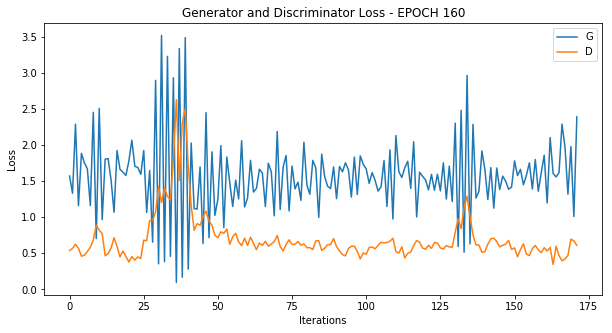

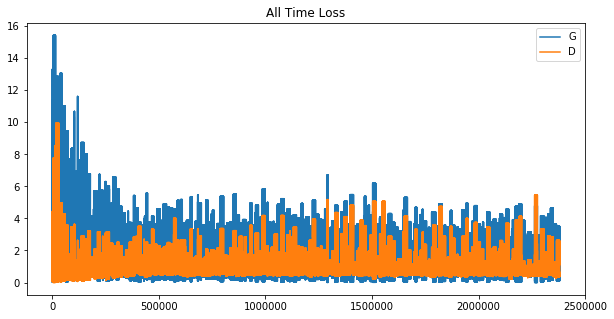

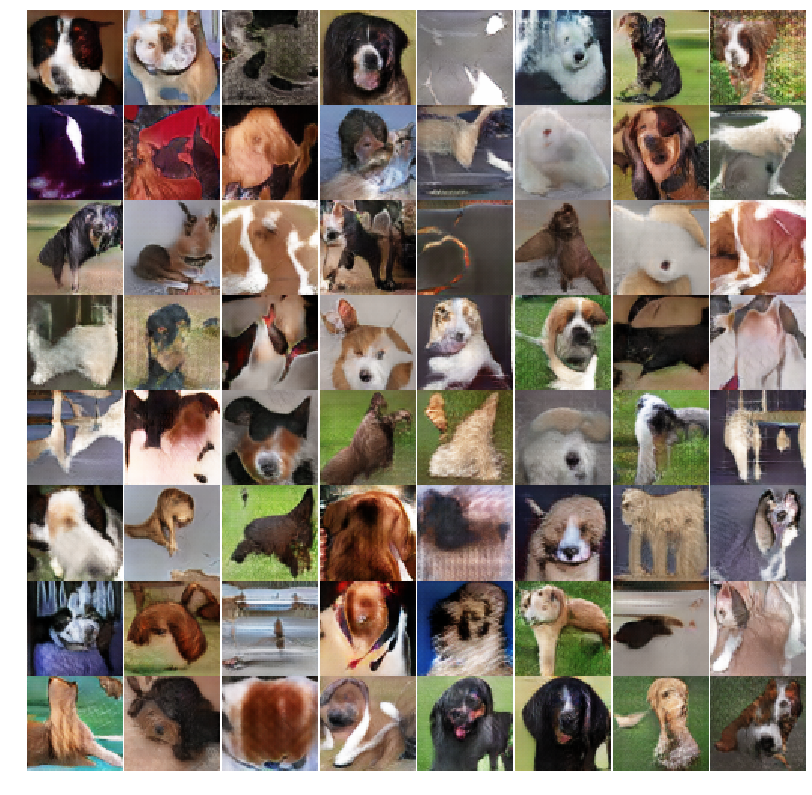

 57%|█████▋    | 160/280 [4:57:14<3:41:31, 110.76s/it]

Epoch: 160 computed for 116.63496732711792 sec
Gen_loss mean:  1.5712181  std:  0.5558466
Disc_loss mean:  0.7043844  std:  0.33125347


 57%|█████▊    | 161/280 [4:59:02<3:38:05, 109.96s/it]

Epoch: 161 computed for 107.89950799942017 sec
Gen_loss mean:  1.5890107  std:  0.58949316
Disc_loss mean:  0.69789743  std:  0.2663397
Epoch: 162 computed for 107.6665313243866 sec
Gen_loss mean:  1.6215587  std:  0.5483364


 58%|█████▊    | 162/280 [5:00:50<3:35:02, 109.34s/it]

Disc_loss mean:  0.63851327  std:  0.17705406


 58%|█████▊    | 163/280 [5:02:39<3:32:38, 109.05s/it]

Epoch: 163 computed for 108.15948486328125 sec
Gen_loss mean:  1.456899  std:  0.821597
Disc_loss mean:  0.98415196  std:  0.7257546
Epoch: 164 computed for 108.046945810318 sec
Gen_loss mean:  1.5778294  std:  0.4771411


 59%|█████▊    | 164/280 [5:04:27<3:30:22, 108.81s/it]

Disc_loss mean:  0.63298094  std:  0.13851532


 59%|█████▉    | 165/280 [5:06:14<3:27:53, 108.47s/it]

Epoch: 165 computed for 107.46516633033752 sec
Gen_loss mean:  1.6105394  std:  0.5467132
Disc_loss mean:  0.6323167  std:  0.13708366
Epoch: 166 computed for 108.22400164604187 sec
Gen_loss mean:  1.5623063  std:  0.73724896


 59%|█████▉    | 166/280 [5:08:03<3:26:05, 108.47s/it]

Disc_loss mean:  0.83695257  std:  0.50049716


 60%|█████▉    | 167/280 [5:09:51<3:23:50, 108.24s/it]

Epoch: 167 computed for 107.49894070625305 sec
Gen_loss mean:  1.5720237  std:  0.44085485
Disc_loss mean:  0.62905794  std:  0.18107547


 60%|██████    | 168/280 [5:11:39<3:22:17, 108.37s/it]

Epoch: 168 computed for 108.46721959114075 sec
Gen_loss mean:  1.6556389  std:  0.6469537
Disc_loss mean:  0.6659353  std:  0.22451402


 60%|██████    | 169/280 [5:13:28<3:20:29, 108.37s/it]

Epoch: 169 computed for 108.16992473602295 sec
Gen_loss mean:  1.6289946  std:  0.60602057
Disc_loss mean:  0.6520284  std:  0.24161147


 61%|██████    | 170/280 [5:15:17<3:19:17, 108.71s/it]

Epoch: 170 computed for 109.29259419441223 sec
Gen_loss mean:  1.2802799  std:  0.6703524
Disc_loss mean:  1.1108166  std:  0.6725057
Epoch: 171 computed for 110.29749631881714 sec
Gen_loss mean:  1.5792037  std:  0.4647141


 61%|██████    | 171/280 [5:17:08<3:18:28, 109.25s/it]

Disc_loss mean:  0.6201243  std:  0.105504744
Epoch: 172 computed for 109.99247455596924 sec
Gen_loss mean:  1.5795583  std:  0.6482964


 61%|██████▏   | 172/280 [5:18:58<3:17:10, 109.54s/it]

Disc_loss mean:  0.75075734  std:  0.46063465
Epoch: 173 computed for 109.33307600021362 sec
Gen_loss mean:  1.549323  std:  0.6462247


 62%|██████▏   | 173/280 [5:20:47<3:15:21, 109.55s/it]

Disc_loss mean:  0.7633585  std:  0.45442066
Epoch: 174 computed for 110.03916931152344 sec
Gen_loss mean:  1.545979  std:  0.6140014


 62%|██████▏   | 174/280 [5:22:38<3:13:54, 109.76s/it]

Disc_loss mean:  0.75606626  std:  0.4207466


 62%|██████▎   | 175/280 [5:24:27<3:11:52, 109.64s/it]

Epoch: 175 computed for 109.16653275489807 sec
Gen_loss mean:  1.6110778  std:  0.46304363
Disc_loss mean:  0.6039047  std:  0.13640134
Epoch: 176 computed for 108.47749066352844 sec
Gen_loss mean:  1.574937  std:  0.73092484


 63%|██████▎   | 176/280 [5:26:16<3:09:33, 109.36s/it]

Disc_loss mean:  0.81436354  std:  0.5072496
Epoch: 177 computed for 108.79779291152954 sec
Gen_loss mean:  1.5869895  std:  0.5025146


 63%|██████▎   | 177/280 [5:28:05<3:07:33, 109.26s/it]

Disc_loss mean:  0.64257807  std:  0.17921618
Epoch: 178 computed for 108.81368684768677 sec
Gen_loss mean:  1.6121418  std:  0.5583726


 64%|██████▎   | 178/280 [5:29:54<3:05:37, 109.19s/it]

Disc_loss mean:  0.6477541  std:  0.20424363
Epoch: 179 computed for 108.82439708709717 sec
Gen_loss mean:  1.615678  std:  0.6426881


 64%|██████▍   | 179/280 [5:31:43<3:03:43, 109.14s/it]

Disc_loss mean:  0.7014709  std:  0.34921378
Epoch: 180 computed for 109.59827303886414 sec
Gen_loss mean:  1.6021987  std:  0.5927252


 64%|██████▍   | 180/280 [5:33:33<3:02:14, 109.34s/it]

Disc_loss mean:  0.68739814  std:  0.30841446


 65%|██████▍   | 181/280 [5:35:21<2:59:56, 109.05s/it]

Epoch: 181 computed for 108.17657279968262 sec
Gen_loss mean:  1.6401676  std:  0.5222144
Disc_loss mean:  0.61424416  std:  0.19557159


 65%|██████▌   | 182/280 [5:37:10<2:57:53, 108.92s/it]

Epoch: 182 computed for 108.3846538066864 sec
Gen_loss mean:  1.4953154  std:  0.655283
Disc_loss mean:  0.8667599  std:  0.6877951
Epoch: 183 computed for 109.28069400787354 sec
Gen_loss mean:  1.6137295  std:  0.5750054


 65%|██████▌   | 183/280 [5:38:59<2:56:21, 109.09s/it]

Disc_loss mean:  0.64949924  std:  0.16442402
Epoch: 184 computed for 108.3601508140564 sec
Gen_loss mean:  1.6550322  std:  0.70654666


 66%|██████▌   | 184/280 [5:40:48<2:54:17, 108.94s/it]

Disc_loss mean:  0.72188354  std:  0.48007813
Epoch: 185 computed for 108.9083640575409 sec
Gen_loss mean:  1.5774692  std:  0.48259228


 66%|██████▌   | 185/280 [5:42:37<2:52:34, 108.99s/it]

Disc_loss mean:  0.6421565  std:  0.15824026
Epoch: 186 computed for 108.97307538986206 sec
Gen_loss mean:  1.6151818  std:  0.52982825


 66%|██████▋   | 186/280 [5:44:26<2:50:50, 109.05s/it]

Disc_loss mean:  0.64180106  std:  0.23678164
Epoch: 187 computed for 109.39870762825012 sec
Gen_loss mean:  1.6534601  std:  0.61033833


 67%|██████▋   | 187/280 [5:46:16<2:49:17, 109.22s/it]

Disc_loss mean:  0.6461304  std:  0.22605169
Epoch: 188 computed for 109.82242274284363 sec
Gen_loss mean:  1.6239258  std:  0.71224517


 67%|██████▋   | 188/280 [5:48:06<2:47:51, 109.47s/it]

Disc_loss mean:  0.7734724  std:  0.58738565
Epoch: 189 computed for 109.92944097518921 sec
Gen_loss mean:  1.5869381  std:  0.58809936


 68%|██████▊   | 189/280 [5:49:56<2:46:20, 109.67s/it]

Disc_loss mean:  0.71832985  std:  0.39763492
Epoch: 190 computed for 109.9659652709961 sec
Gen_loss mean:  1.6102946  std:  0.45955962


 68%|██████▊   | 190/280 [5:51:46<2:44:44, 109.82s/it]

Disc_loss mean:  0.6070446  std:  0.1399092
Epoch: 191 computed for 111.11414074897766 sec
Gen_loss mean:  1.6092682  std:  0.68807167


 68%|██████▊   | 191/280 [5:53:37<2:43:34, 110.28s/it]

Disc_loss mean:  0.7778754  std:  0.6018291
Epoch: 192 computed for 109.7642571926117 sec
Gen_loss mean:  1.6305481  std:  0.525982


 69%|██████▊   | 192/280 [5:55:27<2:41:36, 110.19s/it]

Disc_loss mean:  0.6088012  std:  0.1477052
Epoch: 193 computed for 110.2821478843689 sec
Gen_loss mean:  1.6321954  std:  0.5136383


 69%|██████▉   | 193/280 [5:57:18<2:39:55, 110.29s/it]

Disc_loss mean:  0.60390776  std:  0.14015104
Epoch: 194 computed for 110.79614353179932 sec
Gen_loss mean:  1.3941478  std:  0.71444505


 69%|██████▉   | 194/280 [5:59:09<2:38:24, 110.52s/it]

Disc_loss mean:  1.0055957  std:  0.68310565
Epoch: 195 computed for 110.14497065544128 sec
Gen_loss mean:  1.6318645  std:  0.5595126


 70%|██████▉   | 195/280 [6:00:59<2:36:29, 110.47s/it]

Disc_loss mean:  0.6379033  std:  0.2791291
Epoch: 196 computed for 110.22651958465576 sec
Gen_loss mean:  1.6206445  std:  0.5115351


 70%|███████   | 196/280 [6:02:50<2:34:39, 110.47s/it]

Disc_loss mean:  0.62587553  std:  0.15848267
Epoch: 197 computed for 110.68955850601196 sec
Gen_loss mean:  1.6349328  std:  0.5483934


 70%|███████   | 197/280 [6:04:41<2:33:00, 110.61s/it]

Disc_loss mean:  0.61892915  std:  0.1414423
Epoch: 198 computed for 110.27170538902283 sec
Gen_loss mean:  1.6809059  std:  0.59192795


 71%|███████   | 198/280 [6:06:31<2:31:06, 110.57s/it]

Disc_loss mean:  0.60767764  std:  0.15490453
Epoch: 199 computed for 110.47150325775146 sec
Gen_loss mean:  1.6655971  std:  0.5522327


 71%|███████   | 199/280 [6:08:22<2:29:19, 110.61s/it]

Disc_loss mean:  0.6103782  std:  0.16458334


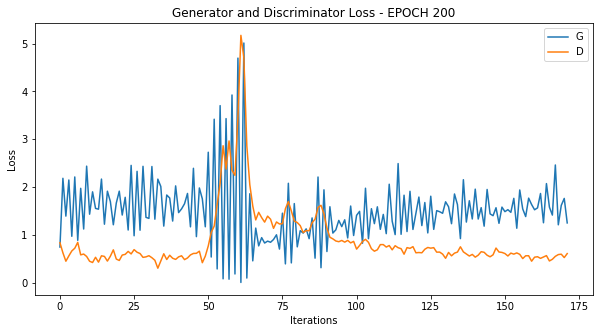

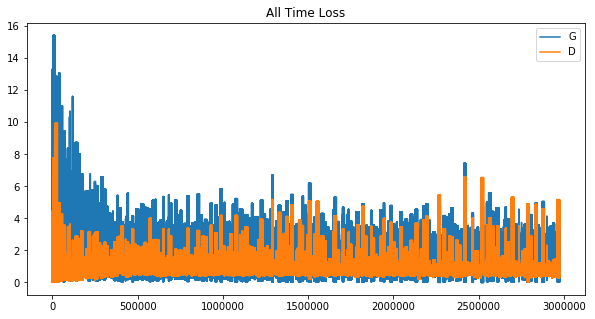

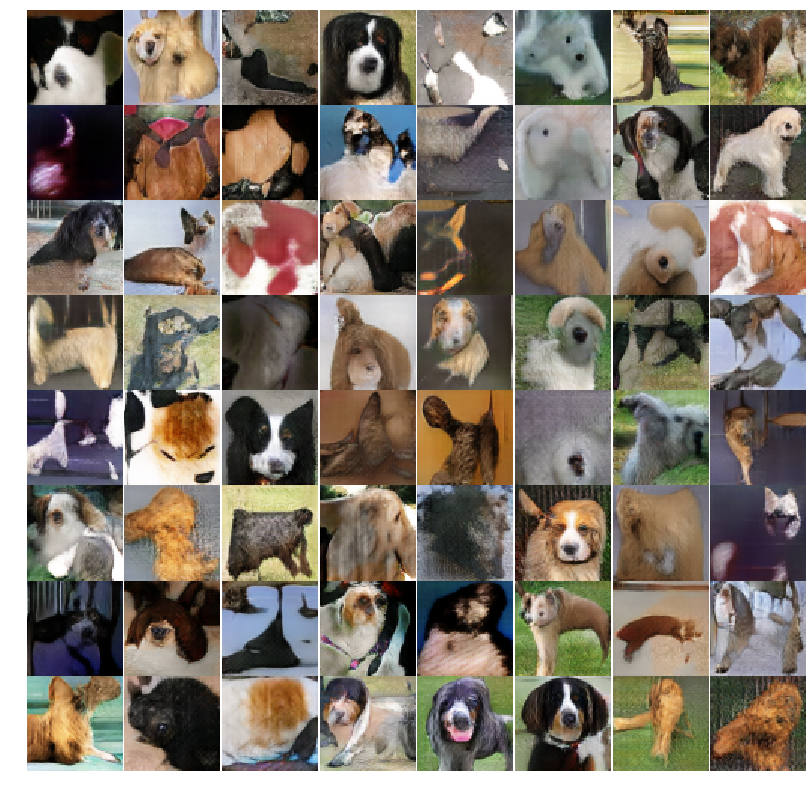

Saved temporary images for evaluation.
FID: 64.86414
distance: 1.00000
MiFID: 64.86414
Removed temporary image directory.
Epoch: 200 computed for 593.3162455558777 sec
Gen_loss mean:  1.5060453  std:  0.71984845


 71%|███████▏  | 200/280 [6:18:15<5:40:39, 255.49s/it]

Disc_loss mean:  0.89928776  std:  0.6739399
Epoch: 201 computed for 110.77920818328857 sec
Gen_loss mean:  1.6271402  std:  0.4591515


 72%|███████▏  | 201/280 [6:20:06<4:39:19, 212.14s/it]

Disc_loss mean:  0.5908192  std:  0.10845849


 72%|███████▏  | 202/280 [6:21:56<3:55:49, 181.40s/it]

Epoch: 202 computed for 109.47250270843506 sec
Gen_loss mean:  1.4993504  std:  0.62038857
Disc_loss mean:  0.8441349  std:  0.57398874
Epoch: 203 computed for 109.57842922210693 sec
Gen_loss mean:  1.6542499  std:  0.49633658


 72%|███████▎  | 203/280 [6:23:46<3:25:13, 159.92s/it]

Disc_loss mean:  0.5797033  std:  0.11571778
Epoch: 204 computed for 110.60331153869629 sec
Gen_loss mean:  1.5589048  std:  0.69698566


 73%|███████▎  | 204/280 [6:25:37<3:03:54, 145.19s/it]

Disc_loss mean:  0.8339944  std:  0.5625831


 73%|███████▎  | 205/280 [6:27:27<2:48:28, 134.78s/it]

Epoch: 205 computed for 110.27768635749817 sec
Gen_loss mean:  1.6555144  std:  0.5087662
Disc_loss mean:  0.58954006  std:  0.1187219
Epoch: 206 computed for 111.08975219726562 sec
Gen_loss mean:  1.6590679  std:  0.58176607


 74%|███████▎  | 206/280 [6:29:19<2:37:32, 127.74s/it]

Disc_loss mean:  0.62941855  std:  0.23927508
Epoch: 207 computed for 109.40660095214844 sec
Gen_loss mean:  1.4395448  std:  0.6876427


 74%|███████▍  | 207/280 [6:31:08<2:28:48, 122.31s/it]

Disc_loss mean:  0.94483894  std:  0.5879069


 74%|███████▍  | 208/280 [6:32:59<2:22:28, 118.73s/it]

Epoch: 208 computed for 110.18831634521484 sec
Gen_loss mean:  1.6811066  std:  0.52420485
Disc_loss mean:  0.5812568  std:  0.16005497
Epoch: 209 computed for 110.98660850524902 sec
Gen_loss mean:  1.6013961  std:  0.6106773


 75%|███████▍  | 209/280 [6:34:50<2:17:49, 116.48s/it]

Disc_loss mean:  0.7094977  std:  0.39146882
Epoch: 210 computed for 109.72785258293152 sec
Gen_loss mean:  1.6858212  std:  0.6087094


 75%|███████▌  | 210/280 [6:36:40<2:13:36, 114.52s/it]

Disc_loss mean:  0.6120807  std:  0.21603781
Epoch: 211 computed for 110.32139706611633 sec
Gen_loss mean:  1.5347635  std:  0.7188938


 75%|███████▌  | 211/280 [6:38:30<2:10:19, 113.33s/it]

Disc_loss mean:  0.85634255  std:  0.5958173
Epoch: 212 computed for 111.31216192245483 sec
Gen_loss mean:  1.6072487  std:  0.43806717


 76%|███████▌  | 212/280 [6:40:22<2:07:49, 112.79s/it]

Disc_loss mean:  0.6075091  std:  0.11619978
Epoch: 213 computed for 110.48796272277832 sec
Gen_loss mean:  1.6775069  std:  0.56083286


 76%|███████▌  | 213/280 [6:42:13<2:05:15, 112.17s/it]

Disc_loss mean:  0.5975376  std:  0.17075211
Epoch: 214 computed for 110.61751866340637 sec
Gen_loss mean:  1.5344427  std:  0.7398521


 76%|███████▋  | 214/280 [6:44:03<2:02:57, 111.78s/it]

Disc_loss mean:  0.8735432  std:  0.6929633
Epoch: 215 computed for 109.25895738601685 sec
Gen_loss mean:  1.3557128  std:  0.5579576


 77%|███████▋  | 215/280 [6:45:53<2:00:20, 111.09s/it]

Disc_loss mean:  0.9034355  std:  0.4015374
Epoch: 216 computed for 109.02209734916687 sec
Gen_loss mean:  1.6505427  std:  0.60427296


 77%|███████▋  | 216/280 [6:47:42<1:57:54, 110.53s/it]

Disc_loss mean:  0.64900047  std:  0.21071658


 78%|███████▊  | 217/280 [6:49:31<1:55:41, 110.18s/it]

Epoch: 217 computed for 109.15867710113525 sec
Gen_loss mean:  1.6681316  std:  0.4791377
Disc_loss mean:  0.57010394  std:  0.1409614
Epoch: 218 computed for 109.72848796844482 sec
Gen_loss mean:  1.6396725  std:  0.6195773


 78%|███████▊  | 218/280 [6:51:21<1:53:46, 110.11s/it]

Disc_loss mean:  0.7108291  std:  0.4834034
Epoch: 219 computed for 108.83645963668823 sec
Gen_loss mean:  1.6801634  std:  0.47204685


 78%|███████▊  | 219/280 [6:53:10<1:51:37, 109.80s/it]

Disc_loss mean:  0.5674749  std:  0.123339064
Epoch: 220 computed for 109.4937469959259 sec
Gen_loss mean:  1.5319558  std:  0.82704425


 79%|███████▊  | 220/280 [6:55:00<1:49:46, 109.77s/it]

Disc_loss mean:  0.929294  std:  0.70691806


 79%|███████▉  | 221/280 [6:56:49<1:47:40, 109.51s/it]

Epoch: 221 computed for 108.6834409236908 sec
Gen_loss mean:  1.5638107  std:  0.45505244
Disc_loss mean:  0.6609411  std:  0.26170397


 79%|███████▉  | 222/280 [6:58:39<1:45:51, 109.51s/it]

Epoch: 222 computed for 109.31744050979614 sec
Gen_loss mean:  1.6431075  std:  0.5331764
Disc_loss mean:  0.6292067  std:  0.27579933
Epoch: 223 computed for 111.11889362335205 sec
Gen_loss mean:  1.6972827  std:  0.6601864


 80%|███████▉  | 223/280 [7:00:30<1:44:33, 110.06s/it]

Disc_loss mean:  0.6356052  std:  0.23904073
Epoch: 224 computed for 110.0727903842926 sec
Gen_loss mean:  1.6809784  std:  0.417299


 80%|████████  | 224/280 [7:02:20<1:42:47, 110.13s/it]

Disc_loss mean:  0.54263616  std:  0.09432379
Epoch: 225 computed for 110.25880908966064 sec
Gen_loss mean:  1.7193575  std:  0.67994094


 80%|████████  | 225/280 [7:04:11<1:41:02, 110.23s/it]

Disc_loss mean:  0.6510961  std:  0.31469467
Epoch: 226 computed for 110.95697927474976 sec
Gen_loss mean:  1.6778568  std:  0.6426105


 81%|████████  | 226/280 [7:06:02<1:39:27, 110.52s/it]

Disc_loss mean:  0.66786146  std:  0.39360744


 81%|████████  | 227/280 [7:07:52<1:37:32, 110.42s/it]

Epoch: 227 computed for 109.98873829841614 sec
Gen_loss mean:  1.7167025  std:  0.59827566
Disc_loss mean:  0.6038112  std:  0.25473824
Epoch: 228 computed for 110.69231128692627 sec
Gen_loss mean:  1.7116024  std:  0.53209764


 81%|████████▏ | 228/280 [7:09:43<1:35:49, 110.57s/it]

Disc_loss mean:  0.56478196  std:  0.12509216
Epoch: 229 computed for 110.56267952919006 sec
Gen_loss mean:  1.5082947  std:  0.83402276


 82%|████████▏ | 229/280 [7:11:34<1:34:02, 110.63s/it]

Disc_loss mean:  0.9597026  std:  0.6771663


 82%|████████▏ | 230/280 [7:13:24<1:32:08, 110.58s/it]

Epoch: 230 computed for 110.23796820640564 sec
Gen_loss mean:  1.6047406  std:  0.50643927
Disc_loss mean:  0.6430672  std:  0.21758048
Epoch: 231 computed for 110.76350450515747 sec
Gen_loss mean:  1.7120631  std:  0.5611234


 82%|████████▎ | 231/280 [7:15:15<1:30:24, 110.70s/it]

Disc_loss mean:  0.5863685  std:  0.20628121
Epoch: 232 computed for 110.93108582496643 sec
Gen_loss mean:  1.7201741  std:  0.5173178


 83%|████████▎ | 232/280 [7:17:06<1:28:39, 110.83s/it]

Disc_loss mean:  0.5553437  std:  0.12797329
Epoch: 233 computed for 111.0956768989563 sec
Gen_loss mean:  1.7444167  std:  0.56822956


 83%|████████▎ | 233/280 [7:18:58<1:26:55, 110.97s/it]

Disc_loss mean:  0.55209464  std:  0.124735884
Epoch: 234 computed for 111.67394638061523 sec
Gen_loss mean:  1.6875781  std:  0.6537514


 84%|████████▎ | 234/280 [7:20:50<1:25:17, 111.25s/it]

Disc_loss mean:  0.6875935  std:  0.47670904
Epoch: 235 computed for 110.55783677101135 sec
Gen_loss mean:  1.7279543  std:  0.5721939


 84%|████████▍ | 235/280 [7:22:40<1:23:19, 111.10s/it]

Disc_loss mean:  0.56916505  std:  0.15399314
Epoch: 236 computed for 111.41342997550964 sec
Gen_loss mean:  1.5156177  std:  0.7452162


 84%|████████▍ | 236/280 [7:24:32<1:21:35, 111.26s/it]

Disc_loss mean:  0.9290129  std:  0.7328116
Epoch: 237 computed for 111.06440162658691 sec
Gen_loss mean:  1.6882448  std:  0.51383555


 85%|████████▍ | 237/280 [7:26:23<1:19:44, 111.27s/it]

Disc_loss mean:  0.58265924  std:  0.16259038
Epoch: 238 computed for 110.96455907821655 sec
Gen_loss mean:  1.6915737  std:  0.6008071


 85%|████████▌ | 238/280 [7:28:14<1:17:52, 111.24s/it]

Disc_loss mean:  0.6074161  std:  0.18471166
Epoch: 239 computed for 111.42899250984192 sec
Gen_loss mean:  1.735648  std:  0.5412121


 85%|████████▌ | 239/280 [7:30:06<1:16:05, 111.36s/it]

Disc_loss mean:  0.55231035  std:  0.16292305


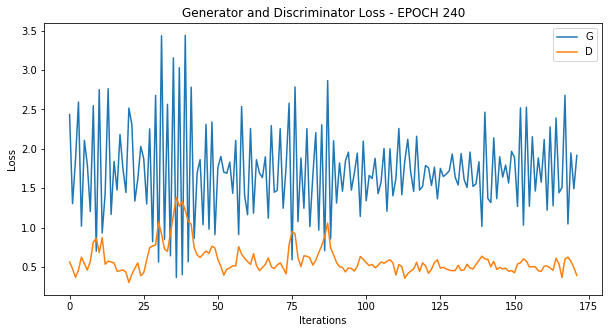

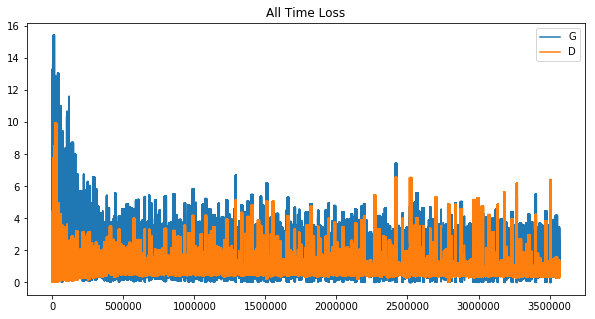

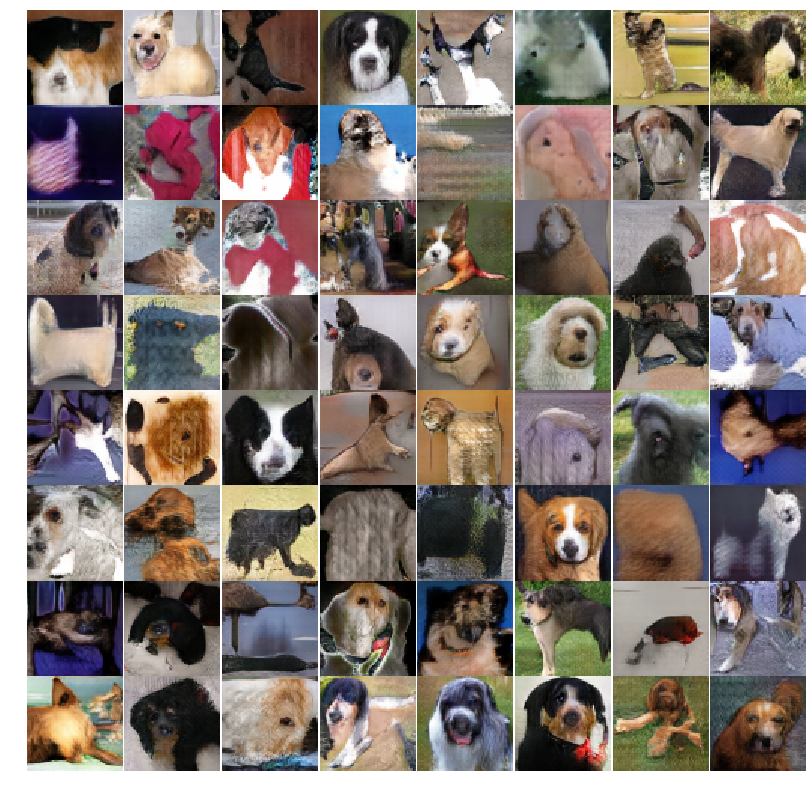

 86%|████████▌ | 240/280 [7:32:09<1:16:32, 114.82s/it]

Epoch: 240 computed for 122.67128348350525 sec
Gen_loss mean:  1.7169698  std:  0.57723063
Disc_loss mean:  0.5876629  std:  0.18421805
Epoch: 241 computed for 111.86974120140076 sec
Gen_loss mean:  1.7683244  std:  0.54113925


 86%|████████▌ | 241/280 [7:34:01<1:14:05, 114.00s/it]

Disc_loss mean:  0.5356291  std:  0.12572956
Epoch: 242 computed for 111.22064709663391 sec
Gen_loss mean:  1.5759444  std:  0.65599984


 86%|████████▋ | 242/280 [7:35:52<1:11:42, 113.23s/it]

Disc_loss mean:  0.8146682  std:  0.60908234
Epoch: 243 computed for 110.26513385772705 sec
Gen_loss mean:  1.7367582  std:  0.5957331


 87%|████████▋ | 243/280 [7:37:43<1:09:18, 112.40s/it]

Disc_loss mean:  0.58091915  std:  0.16925262
Epoch: 244 computed for 110.07227873802185 sec
Gen_loss mean:  1.7342203  std:  0.59032303


 87%|████████▋ | 244/280 [7:39:33<1:07:03, 111.77s/it]

Disc_loss mean:  0.5844054  std:  0.22572443
Epoch: 245 computed for 110.60531044006348 sec
Gen_loss mean:  1.7112343  std:  0.7495919


 88%|████████▊ | 245/280 [7:41:24<1:05:01, 111.48s/it]

Disc_loss mean:  0.7341856  std:  0.5503653
Epoch: 246 computed for 110.6942777633667 sec
Gen_loss mean:  1.7443045  std:  0.4907814


 88%|████████▊ | 246/280 [7:43:15<1:03:04, 111.31s/it]

Disc_loss mean:  0.5408021  std:  0.18848893
Epoch: 247 computed for 110.5172049999237 sec
Gen_loss mean:  1.5180639  std:  0.7307562


 88%|████████▊ | 247/280 [7:45:06<1:01:07, 111.14s/it]

Disc_loss mean:  0.90657467  std:  0.6636342


 89%|████████▊ | 248/280 [7:46:57<59:14, 111.07s/it]  

Epoch: 248 computed for 110.69968724250793 sec
Gen_loss mean:  1.726576  std:  0.47984037
Disc_loss mean:  0.5540384  std:  0.18910079
Epoch: 249 computed for 110.42309403419495 sec
Gen_loss mean:  1.7678231  std:  0.5703996
Disc_loss mean:  0.55266976  std:  

 89%|████████▉ | 249/280 [7:48:47<57:19, 110.94s/it]

0.20517229
Epoch: 250 computed for 110.65043926239014 sec
Gen_loss mean:  1.7661675  std:  0.5233086


 89%|████████▉ | 250/280 [7:50:38<55:27, 110.91s/it]

Disc_loss mean:  0.5309296  std:  0.13144192
Epoch: 251 computed for 110.01396346092224 sec
Gen_loss mean:  1.79694  std:  0.59473914


 90%|████████▉ | 251/280 [7:52:28<53:30, 110.72s/it]

Disc_loss mean:  0.53899574  std:  0.1405523
Epoch: 252 computed for 110.41073966026306 sec
Gen_loss mean:  1.6363928  std:  0.7629811


 90%|█████████ | 252/280 [7:54:19<51:39, 110.69s/it]

Disc_loss mean:  0.793576  std:  0.59248084
Epoch: 253 computed for 110.67416715621948 sec
Gen_loss mean:  1.7584157  std:  0.5007525


 90%|█████████ | 253/280 [7:56:10<49:50, 110.75s/it]

Disc_loss mean:  0.5372843  std:  0.17156637
Epoch: 254 computed for 110.42781162261963 sec
Gen_loss mean:  1.770055  std:  0.55660236


 91%|█████████ | 254/280 [7:58:00<47:58, 110.72s/it]

Disc_loss mean:  0.53773063  std:  0.1324601
Epoch: 255 computed for 110.80660438537598 sec


 91%|█████████ | 255/280 [7:59:52<46:11, 110.87s/it]

Gen_loss mean:  1.7564392  std:  0.76142395
Disc_loss mean:  0.67890364  std:  0.31787938
Epoch: 256 computed for 110.16360926628113 sec
Gen_loss mean:  1.7814708  std:  0.47081274


 91%|█████████▏| 256/280 [8:01:42<44:17, 110.73s/it]

Disc_loss mean:  0.5011691  std:  0.089866444
Epoch: 257 computed for 110.77156209945679 sec
Gen_loss mean:  1.712935  std:  0.64043814


 92%|█████████▏| 257/280 [8:03:33<42:28, 110.82s/it]

Disc_loss mean:  0.6707016  std:  0.47826523
Epoch: 258 computed for 110.67313241958618 sec
Gen_loss mean:  1.7266293  std:  0.6583947


 92%|█████████▏| 258/280 [8:05:24<40:38, 110.84s/it]

Disc_loss mean:  0.65410924  std:  0.34704006
Epoch: 259 computed for 109.65763521194458 sec
Gen_loss mean:  1.7809991  std:  0.5228798


 92%|█████████▎| 259/280 [8:07:14<38:41, 110.56s/it]

Disc_loss mean:  0.519418  std:  0.12589987
Epoch: 260 computed for 111.03564500808716 sec
Gen_loss mean:  1.7349417  std:  0.7880438


 93%|█████████▎| 260/280 [8:09:05<36:55, 110.77s/it]

Disc_loss mean:  0.73169816  std:  0.62232393
Epoch: 261 computed for 111.38007521629333 sec
Gen_loss mean:  1.7731738  std:  0.39494678


 93%|█████████▎| 261/280 [8:10:57<35:09, 111.02s/it]

Disc_loss mean:  0.49064025  std:  0.08104826
Epoch: 262 computed for 111.33936810493469 sec
Gen_loss mean:  1.8098816  std:  0.5419879


 94%|█████████▎| 262/280 [8:12:48<33:21, 111.18s/it]

Disc_loss mean:  0.5035255  std:  0.13001925


 94%|█████████▍| 263/280 [8:14:40<31:30, 111.19s/it]

Epoch: 263 computed for 110.98331713676453 sec
Gen_loss mean:  1.7974623  std:  0.5653335
Disc_loss mean:  0.5280044  std:  0.13693193
Epoch: 264 computed for 111.67010998725891 sec
Gen_loss mean:  1.6328114  std:  0.71560884


 94%|█████████▍| 264/280 [8:16:31<29:42, 111.40s/it]

Disc_loss mean:  0.8181505  std:  0.654471
Epoch: 265 computed for 111.83072590827942 sec
Gen_loss mean:  1.6630788  std:  0.6683783


 95%|█████████▍| 265/280 [8:18:23<27:53, 111.59s/it]

Disc_loss mean:  0.7411202  std:  0.5243569
Epoch: 266 computed for 112.05061340332031 sec
Gen_loss mean:  1.8003892  std:  0.52641654


 95%|█████████▌| 266/280 [8:20:16<26:05, 111.80s/it]

Disc_loss mean:  0.5156922  std:  0.16480637
Epoch: 267 computed for 110.9482536315918 sec
Gen_loss mean:  1.8100674  std:  0.5016313


 95%|█████████▌| 267/280 [8:22:07<24:10, 111.61s/it]

Disc_loss mean:  0.49703428  std:  0.11099057
Epoch: 268 computed for 112.05608248710632 sec
Gen_loss mean:  1.7606986  std:  0.8174183


 96%|█████████▌| 268/280 [8:23:59<22:21, 111.81s/it]

Disc_loss mean:  0.7759457  std:  0.63508785
Epoch: 269 computed for 110.7919135093689 sec
Gen_loss mean:  1.7553227  std:  0.4100333


 96%|█████████▌| 269/280 [8:25:50<20:27, 111.57s/it]

Disc_loss mean:  0.5052807  std:  0.08847148
Epoch: 270 computed for 110.29813528060913 sec
Gen_loss mean:  1.6572585  std:  0.6743139


 96%|█████████▋| 270/280 [8:27:41<18:32, 111.25s/it]

Disc_loss mean:  0.72135276  std:  0.51267684
Epoch: 271 computed for 110.669917345047 sec
Gen_loss mean:  1.8038415  std:  0.43851322


 97%|█████████▋| 271/280 [8:29:32<16:40, 111.14s/it]

Disc_loss mean:  0.48204112  std:  0.09663
Epoch: 272 computed for 110.7066924571991 sec
Gen_loss mean:  1.6047516  std:  0.74534136


 97%|█████████▋| 272/280 [8:31:23<14:48, 111.08s/it]

Disc_loss mean:  0.8306404  std:  0.5711826
Epoch: 273 computed for 110.12301564216614 sec
Gen_loss mean:  1.7692158  std:  0.5951416


 98%|█████████▊| 273/280 [8:33:13<12:56, 110.86s/it]

Disc_loss mean:  0.621595  std:  0.5118972
Epoch: 274 computed for 110.72736620903015 sec
Gen_loss mean:  1.6951886  std:  0.509285


 98%|█████████▊| 274/280 [8:35:04<11:05, 110.88s/it]

Disc_loss mean:  0.58930784  std:  0.21808386


 98%|█████████▊| 275/280 [8:36:55<09:14, 110.84s/it]

Epoch: 275 computed for 110.54123210906982 sec
Gen_loss mean:  1.8216989  std:  0.48379424
Disc_loss mean:  0.48183635  std:  0.081318885


 99%|█████████▊| 276/280 [8:38:46<07:23, 110.87s/it]

Epoch: 276 computed for 110.74258208274841 sec
Gen_loss mean:  1.7284166  std:  0.69105047
Disc_loss mean:  0.6801809  std:  0.46789798


 99%|█████████▉| 277/280 [8:40:37<05:33, 111.07s/it]

Epoch: 277 computed for 111.32938742637634 sec
Gen_loss mean:  1.8354354  std:  0.5773419
Disc_loss mean:  0.51054215  std:  0.14111799
Epoch: 278 computed for 110.137934923172 sec
Gen_loss mean:  1.7250053  std:  0.63966507


 99%|█████████▉| 278/280 [8:42:27<03:41, 110.86s/it]

Disc_loss mean:  0.6870878  std:  0.52044064
Epoch: 279 computed for 111.07135963439941 sec
Gen_loss mean:  1.8219246  std:  0.6834004
Disc_loss mean:  0.63010263  std:  

100%|█████████▉| 279/280 [8:44:19<01:50, 110.98s/it]

0.49588612


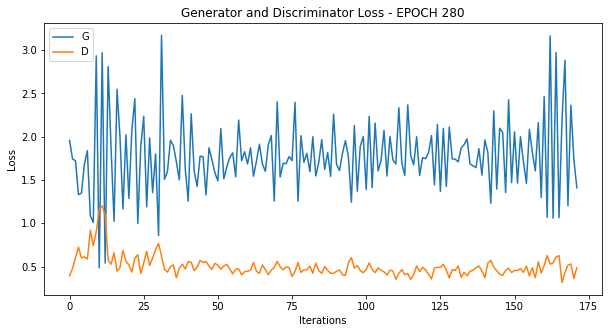

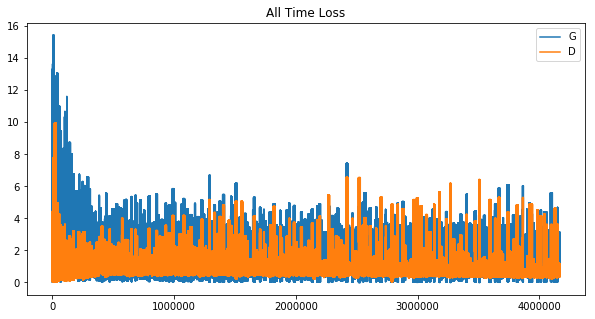

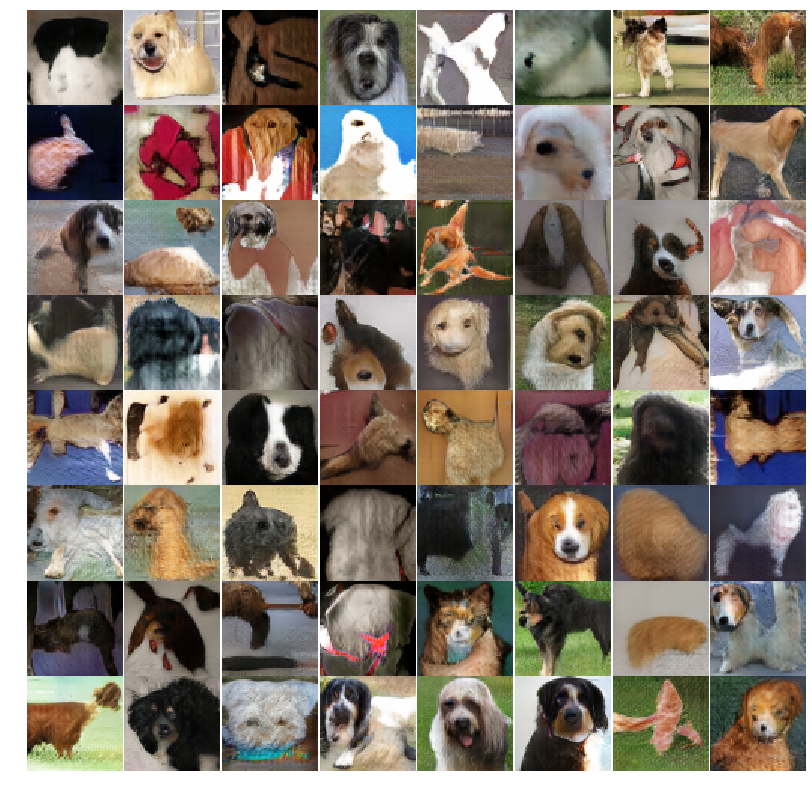

100%|██████████| 280/280 [8:46:22<00:00, 114.80s/it]

Epoch: 280 computed for 123.47100043296814 sec
Gen_loss mean:  1.7764776  std:  0.43656358
Disc_loss mean:  0.503936  std:  0.12422234


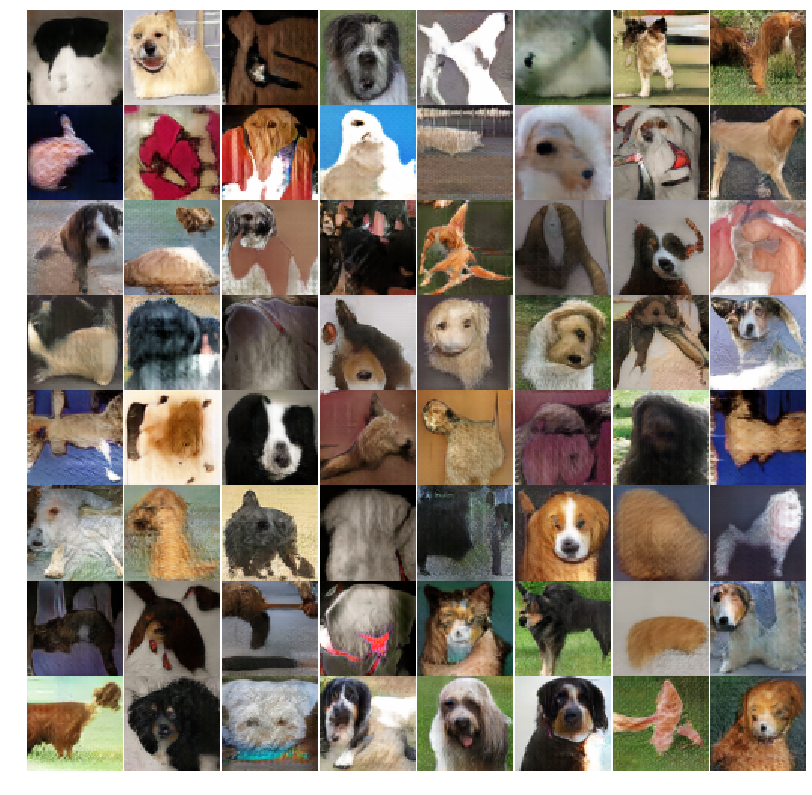

Saved temporary images for evaluation.
FID: 60.99319
distance: 1.00000
MiFID: 60.99319
Removed temporary image directory.
Final epoch.


In [44]:
#%%time
train(dog_features_data, EPOCHS)

&nbsp;&nbsp;&nbsp;As we can observe, the MIFID steadily improves for 260 epochs (~ 8 hours). The best score that I achieved using this model during the competition was <b>55.87</b>. The learning process does tend to be somewhat random so I think a score around the region of <b>[50, 65]</b> should be realistic.

### Generate a test image

&nbsp;&nbsp;&nbsp;We can also reuse one of the previous functions to generate a single random dog image.

In [45]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

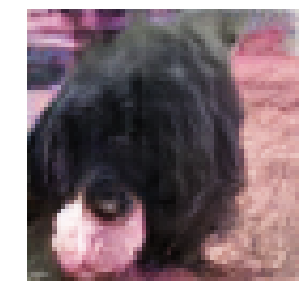

In [46]:
generate_test_image(dog_generator)

### Generate 10000 images for submission and save them to a zip file

In [47]:
#zip_images()

### Create an animated GIF using the training images

In [48]:
# Display a single image using the epoch number
def display_image(epoch_no):
    return Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

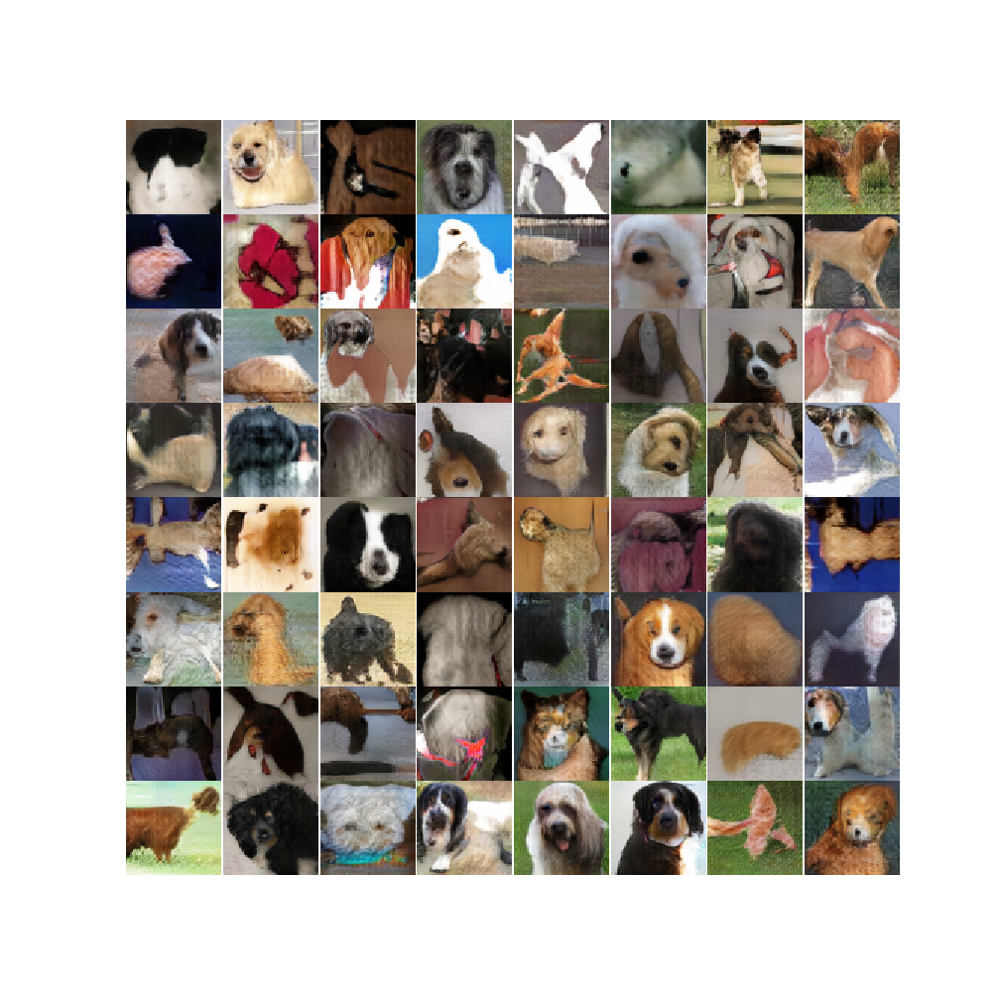

In [49]:
display_image(EPOCHS)

In [50]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('image*.png')
    filenames = sorted(filenames)
    last = -1
    for i,filename in enumerate(filenames):
        frame = 1*(i**2)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

import IPython
if IPython.version_info > (6,2,0,''):
    IPython.display.Image(filename=anim_file)

## Conclusion

&nbsp;&nbsp;&nbsp;To sum up, <b>DCGANs</b> seem to be extremely sensitive to hyperparameter choice and a lot of problems can arise during training, including <b>Mode Collapse</b>. They are also very computationally intensive and it is incredibly hard to build a high-scoring model for a runtime of <b>~9 hours</b>. Fortunately, there is a whole bucket list of possible methods and techniques that are well-documented and can be easily applied to your model to stabilize the training process.

&nbsp;&nbsp;&nbsp;For me personally, it was really fun to toy around with these techniques and break a few kernels in the process :D. Feel free to leave any suggestions down in the comments (for improving the model or fixing something that I messed up).

&nbsp;&nbsp;&nbsp;If this kernel helped you in any way, feel free to leave an upvote. Also big thanks to <b>Chris Deotte, Nanashi, Chad Malla and Nirjhar Roy</b> for their kernels. I'll leave links to them down below.

## References

### Useful Kernels and notebooks

[1]. My previous kernel on [EDA and image preprocessing](https://www.kaggle.com/jadeblue/dog-generator-starter-eda-preprocessing)

[2]. [Xml parsing and cropping to specified bounding box](https://www.kaggle.com/paulorzp/show-annotations-and-breeds)

[3]. [Image cropping method with interpolation](https://www.kaggle.com/amanooo/wgan-gp-keras)

[4]. [Another great Keras-based DCGAN approach by Chad Malla](https://www.kaggle.com/cmalla94/dcgan-generating-dog-images-with-tensorflow)

[5]. [DCGAN hacks for improving your model performance](https://www.kaggle.com/c/generative-dog-images/discussion/98595)

[6]. [Tensorflow DCGAN tutorial](https://www.tensorflow.org/beta/tutorials/generative/dcgan)

[7]. [DCGAN Dogs Images by Nanashi](https://www.kaggle.com/jesucristo/introducing-dcgan-dogs-images)

[8]. [GAN dogs starter 24-Jul -Custom Layers by Nirjhar Roy](https://www.kaggle.com/phoenix9032/gan-dogs-starter-24-jul-custom-layers)

[9]. [Supervised Generative Dog Net by Chris Deotte](https://www.kaggle.com/cdeotte/supervised-generative-dog-net)

[10]. [My best submission for this competition](https://www.kaggle.com/jadeblue/dogdcgan-v6-ksize)

### Research papers, posts and discussions

[1]. [Generative Adversarial Networks official paper](https://arxiv.org/pdf/1406.2661.pdf)

[2]. [Understanding Generative Adversarial Networks (GANs)](https://towardsdatascience.com/understanding-generative-adversarial-networks-gans-cd6e4651a29)

[3]. [A Gentle Introduction to Generative Adversarial Networks (GANs)](https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/)

[4]. [DCGAN official paper](https://arxiv.org/pdf/1511.06434.pdf)

[5]. [GAN — DCGAN (Deep convolutional generative adversarial networks)](https://medium.com/@jonathan_hui/gan-dcgan-deep-convolutional-generative-adversarial-networks-df855c438f)

[6]. [Weight Initialization Techniques in Neural Networks](https://towardsdatascience.com/weight-initialization-techniques-in-neural-networks-26c649eb3b78)

[7]. [Spectral Normalization for Generative Adversarial Networks paper](https://arxiv.org/pdf/1802.05957.pdf)

[8]. [Spectral Normalization implemented in Keras](https://github.com/IShengFang/SpectralNormalizationKeras)

[9]. [Spectral Normalization Explained](https://christiancosgrove.com/blog/2018/01/04/spectral-normalization-explained.html)

[10]. [GAN — Ways to improve GAN performance](https://towardsdatascience.com/gan-ways-to-improve-gan-performance-acf37f9f59b)

[11]. [How to Implement GAN Hacks in Keras to Train Stable Models](https://machinelearningmastery.com/how-to-code-generative-adversarial-network-hacks/)

[12]. [Tricks of GANS](https://lanpartis.github.io/deep%20learning/2018/03/12/tricks-of-gans.html)

[13]. [Instance Noise: A trick for stabilising GAN training](https://www.inference.vc/instance-noise-a-trick-for-stabilising-gan-training/)

[14]. [GAN — RSGAN & RaGAN (A new generation of cost function.)](https://medium.com/@jonathan_hui/gan-rsgan-ragan-a-new-generation-of-cost-function-84c5374d3c6e)

[15]. [A simple explanation of the Inception Score](https://medium.com/octavian-ai/a-simple-explanation-of-the-inception-score-372dff6a8c7a)

[16]. [GAN — How to measure GAN performance?](https://medium.com/@jonathan_hui/gan-how-to-measure-gan-performance-64b988c47732)

[17]. [All you need is GAN Hacks](https://www.kaggle.com/c/generative-dog-images/discussion/98595#latest-582912)

[18]. [How to train your touchy GANs - Things that seem to work.](https://www.kaggle.com/c/generative-dog-images/discussion/102155#latest-599429)

[19]. [Explaining the metric FID](https://www.kaggle.com/c/generative-dog-images/discussion/97809#latest-591866)